In [ ]:
# The script and ipython notebooks were originally saved in the G drive folder, together with the data. 
# On 10/1/2024 I have placed the script and ipython notebooks on the Github folder.

In [1]:
%matplotlib notebook
from beam_tomo import *
plt.rcParams['figure.max_open_warning'] = 50
from scipy.optimize import curve_fit

# Previous work on beam tomography 

Link for report with previous beam tomography:(link)[https://docs.google.com/document/d/1uOGDw6qHZKiGV28OnOs043JRSdri8LaaIsc8oYo4Qxg/edit#bookmark=id.4wuwfttv8kr]


# Description of measurements 

1. Acquisition #1 - 17.29.50 tomography.pkl (z from 14.6 to 16.6, PWM = 7%, exp = 1/40 000, 25us)
2. Acquisition #2 - 17.44.35 tomography.pkl (z from 14.6 to 17.6, PWM = 7%, exp = 1/40 000, 25us)

3. Acquisition #3 - 17.50.51 tomography.pkl (z from 14.6 to 18.6, PWM = 8%, exp = 1/40 000, 25us) - seems decoupled

4. Acquisition #4 - (re-coupled) - 17.56.48 tomography.pkl (z from 14.7 to 18.7)
5. Acquisition #5 - 18.02.48 tomography.pkl -same as acquisition 4, after rechecking coupling;


# List and load measurements 

In [2]:
# Access folder with data in G drive
folder_path = "G:\Shared drives\VitreaLab Share\Lab Data\Light Engine Team\X-Reality Projects (XR)\Augmented Reality (AR)\Lab Data\AR\2023-12-05\beam_tomography\\"
folder_path = r"G:\Shared drives\VitreaLab Share\Lab Data\Light Engine Team\X-Reality Projects (XR)\Augmented Reality (AR)\Lab Data\AR\2023-12-05\beam_tomography\\"
files = [f for f in os.listdir(folder_path) if os.path.isfile(os.path.join(folder_path, f))]
filenames = [item for item in files if ".pkl" in item]

# Parameters
filename = filenames[4]
file_path = os.path.join(folder_path, filename)
shape = (3, 10)
roi_width = 100

# Load data
tomo = Tomography(file_path, (3,10), roi_width)
tomo.load_data()

Loaded
Tomography measurement:

        - Filename = G:\Shared drives\VitreaLab Share\Lab Data\Light Engine Team\X-Reality Projects (XR)\Augmented Reality (AR)\Lab Data\AR\2023-12-05\beam_tomography\\18.02.48 tomography.pkl

        - Number of beam rows = 3

        - Number of beam cols = 10

        - Z-spacing: 0.100mm

        - Number of cross sections: 40
        


# Find rotation angle of the grid and spacing

In [3]:
tomo.find_rot_spacing(angle_min = 46, angle_max = 47, angle_step = 0.25)

Extracting rotation angle for the lowest z cross section.


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:03<00:00,  1.08it/s]


Optimal rotation angle = 46.75deg
Extracting the grid spacing
Average spacing [px] between beams = 145.95
Updating the rotation angle and rotated image for each cross section.


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:07<00:00,  5.45it/s]


# Extract beams coords and width

In [4]:
tomo.init_coords() #Find coords of the first cross section

Coordinates of beam in first layer were determined.


## For a single beam for debugging purposes

In [ ]:
id_x, id_y = 1, 5
tomo.init_coords() #Find coords of the first cross section
beam_i = tomo.beam_l[id_x][id_y]
beam_i.complete_coords_and_widths(tomo.cross_sect_l, tomo.cross_sect_z_l, tomo.roi_width, debug = False)

##  For all beams

In [5]:
tomo.init_coords() #Find coords of the first cross section
tomo.complete_coords_and_widths(debug = False) #Find coords for all the other layers

Coordinates of beam in first layer were determined.


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:02<00:00,  1.19it/s]


In [ ]:
#Iterative - just for monitoring processes
#for id_x in tqdm(range(tomo.shape[0])):
#    for id_y in range(tomo.shape[1]):
#        print(f"id_x = {id_x}, id_y = {id_y}")
#        tomo.complete_beam_coords(id_x, id_y, debug = False)

# Plot single beam

## plot beam trajectory and width

<IPython.core.display.Javascript object>


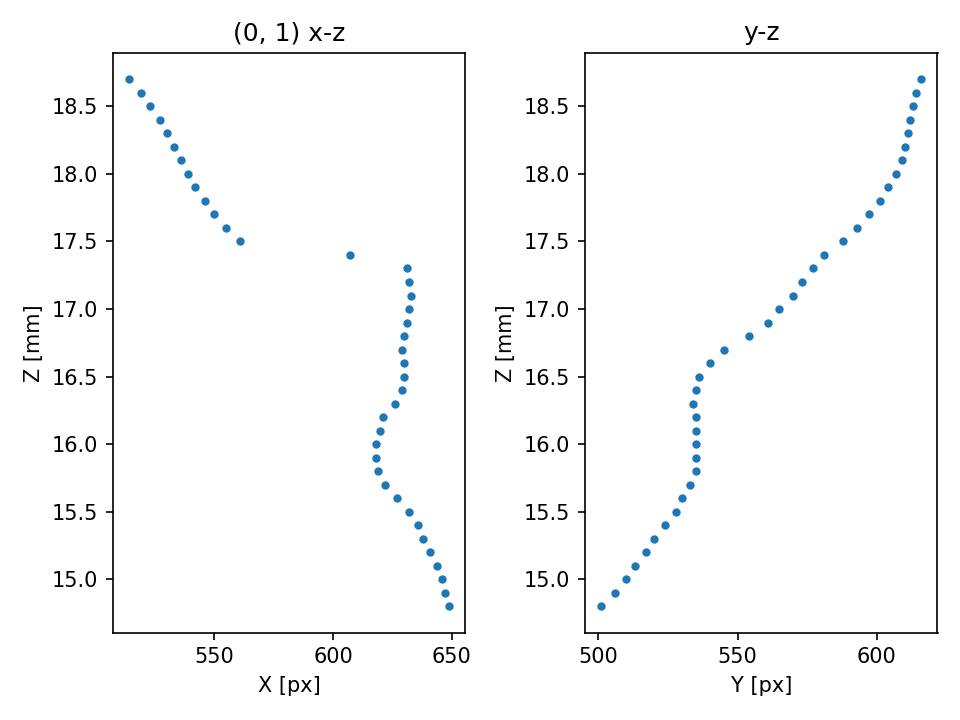

(<Figure size 640x480 with 2 Axes>,
 array([<AxesSubplot:title={'center':'(0, 1) x-z'}, xlabel='X [px]', ylabel='Z [mm]'>,
        <AxesSubplot:title={'center':'y-z'}, xlabel='Y [px]', ylabel='Z [mm]'>],
       dtype=object))

In [8]:
id_x = 0
id_y = 1
beam_i = tomo.beam_l[id_x][id_y]
beam_i.plot_trajectory()


## Plot single beam width evolution

<IPython.core.display.Javascript object>


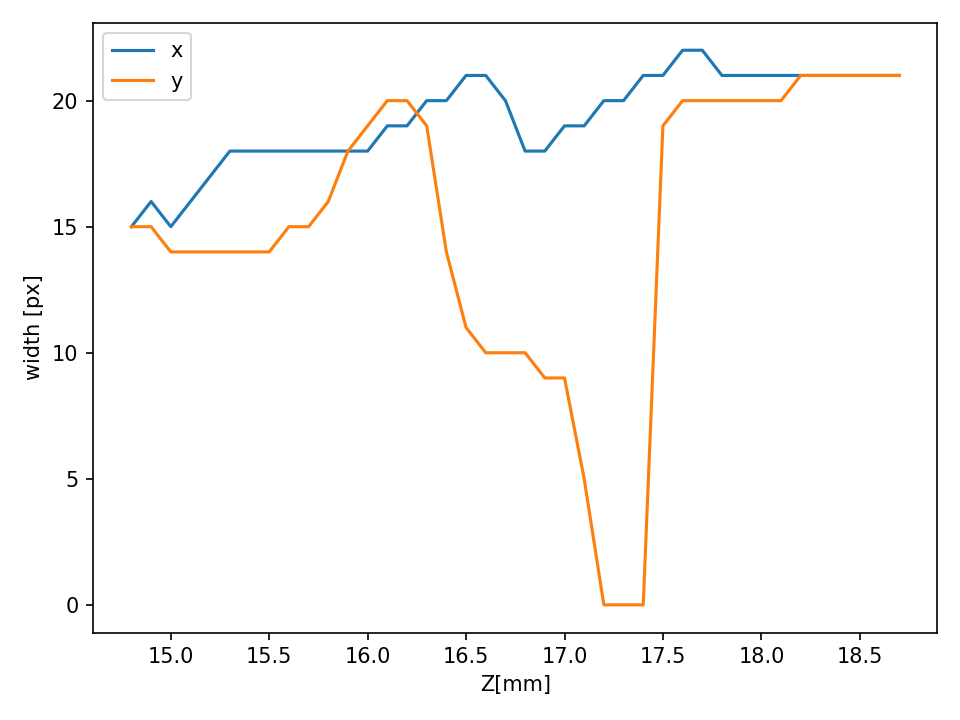

(<Figure size 640x480 with 1 Axes>,
 <AxesSubplot:xlabel='Z[mm]', ylabel='width [px]'>)

In [14]:
id_x = 0
id_y = 1
beam_i = tomo.beam_l[id_x][id_y]
beam_i.plot_width(limit_z_fit=False)


## Plot ROIs

<IPython.core.display.Javascript object>


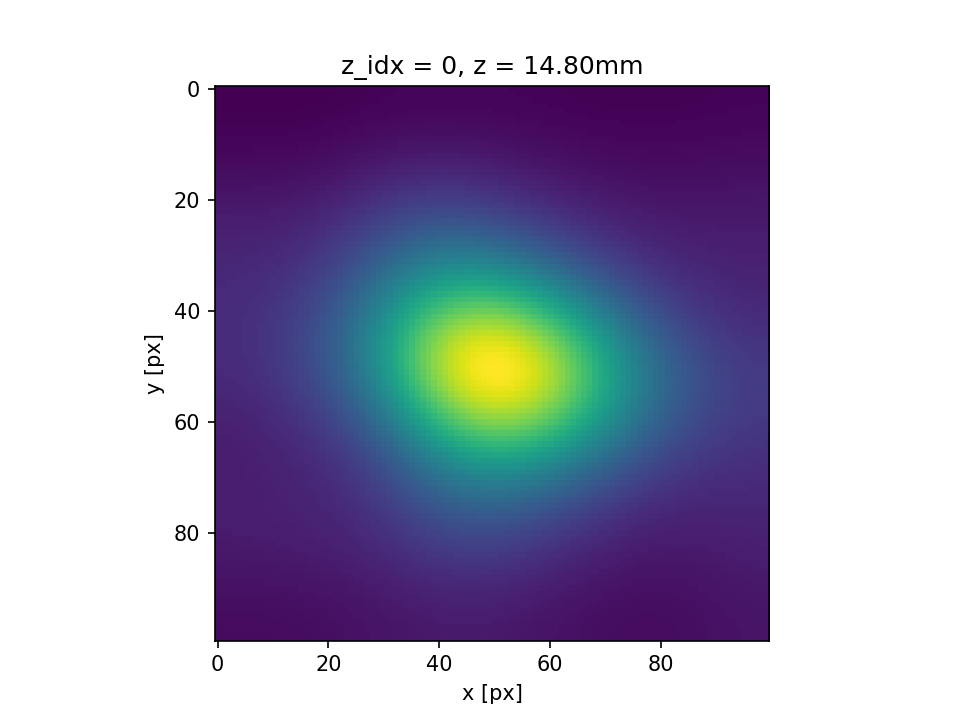

<IPython.core.display.Javascript object>


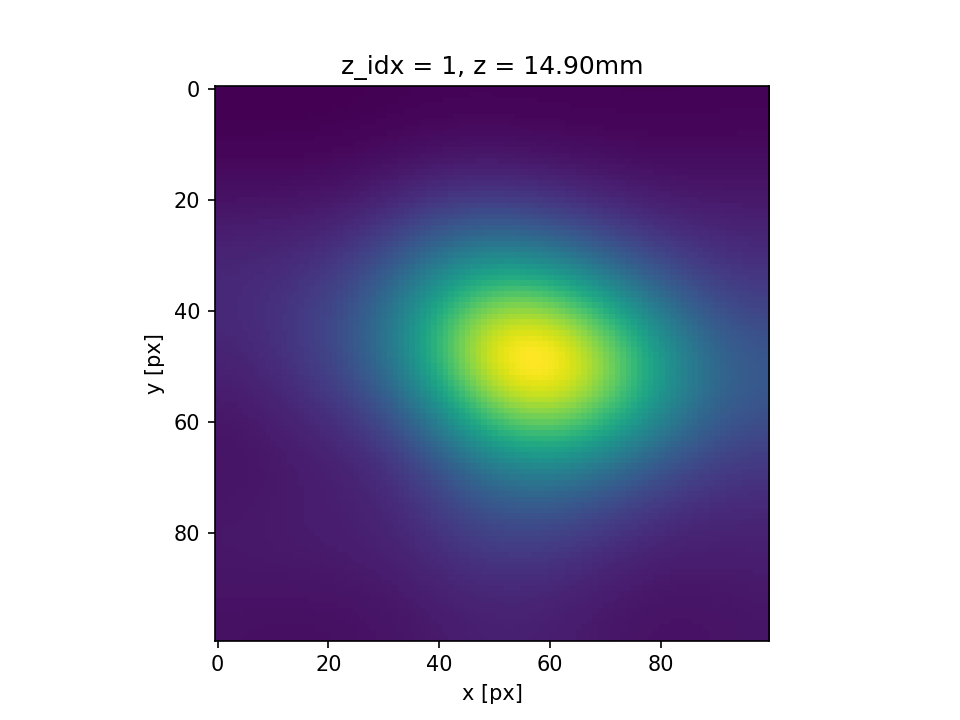

<IPython.core.display.Javascript object>


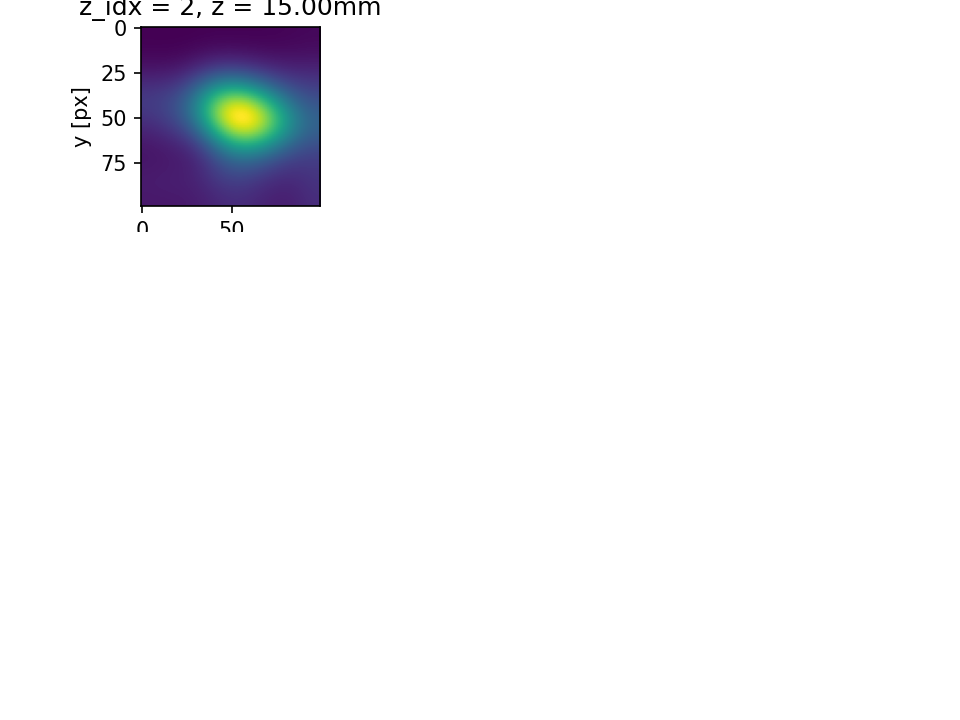

<IPython.core.display.Javascript object>


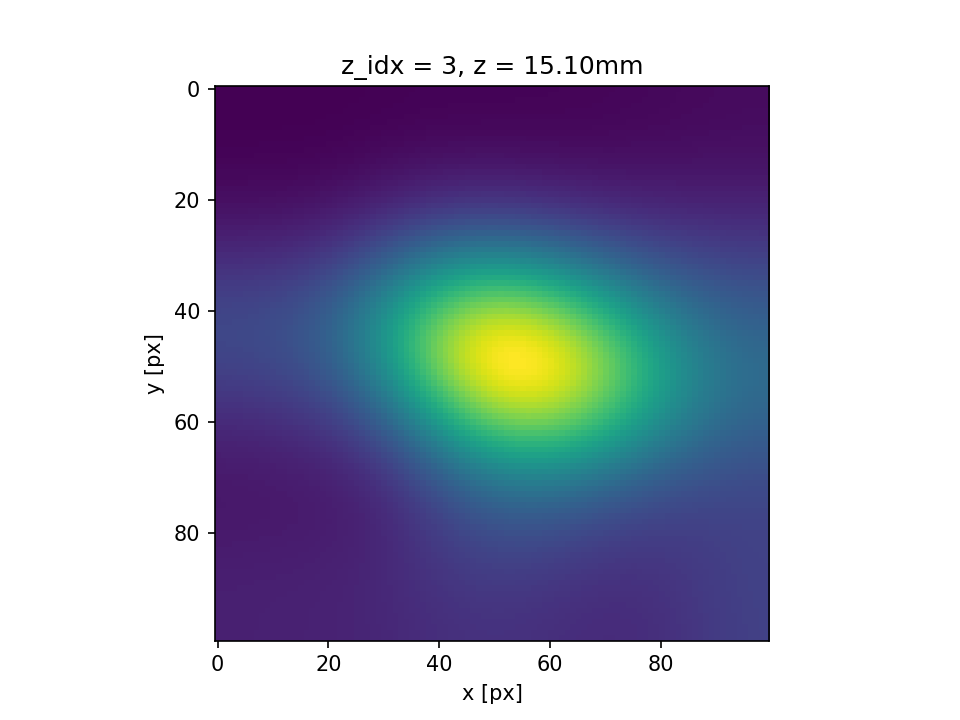

<IPython.core.display.Javascript object>


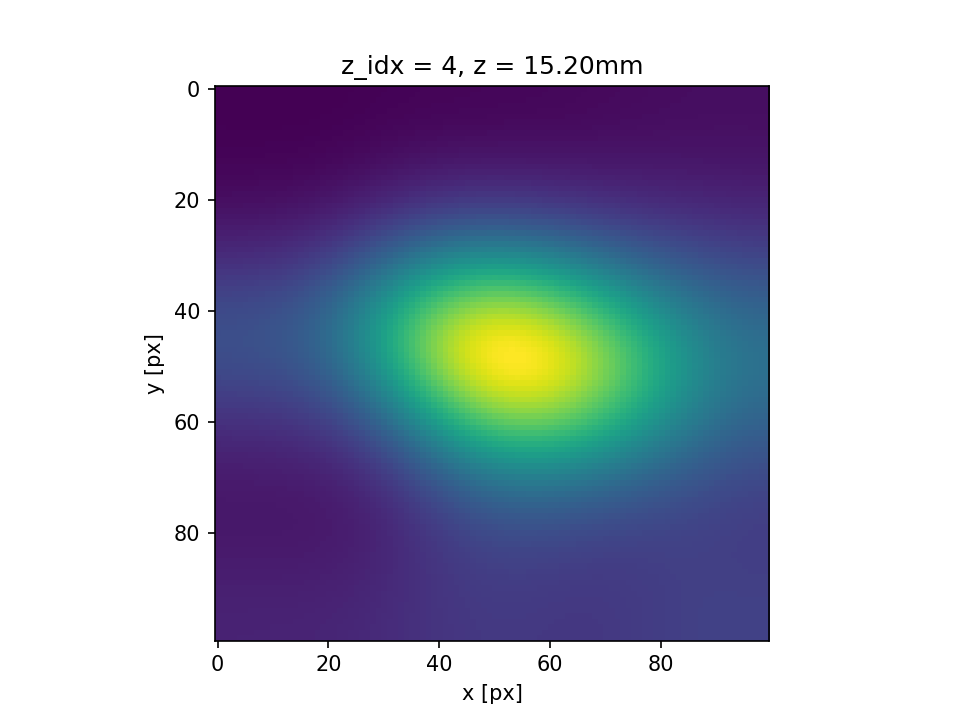

<IPython.core.display.Javascript object>


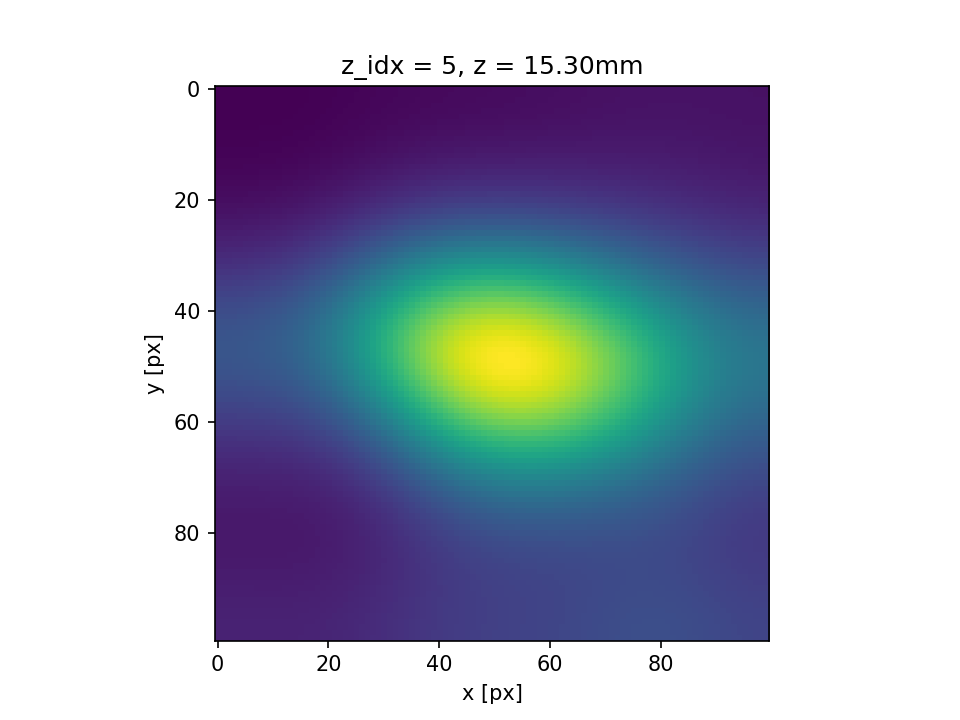

<IPython.core.display.Javascript object>


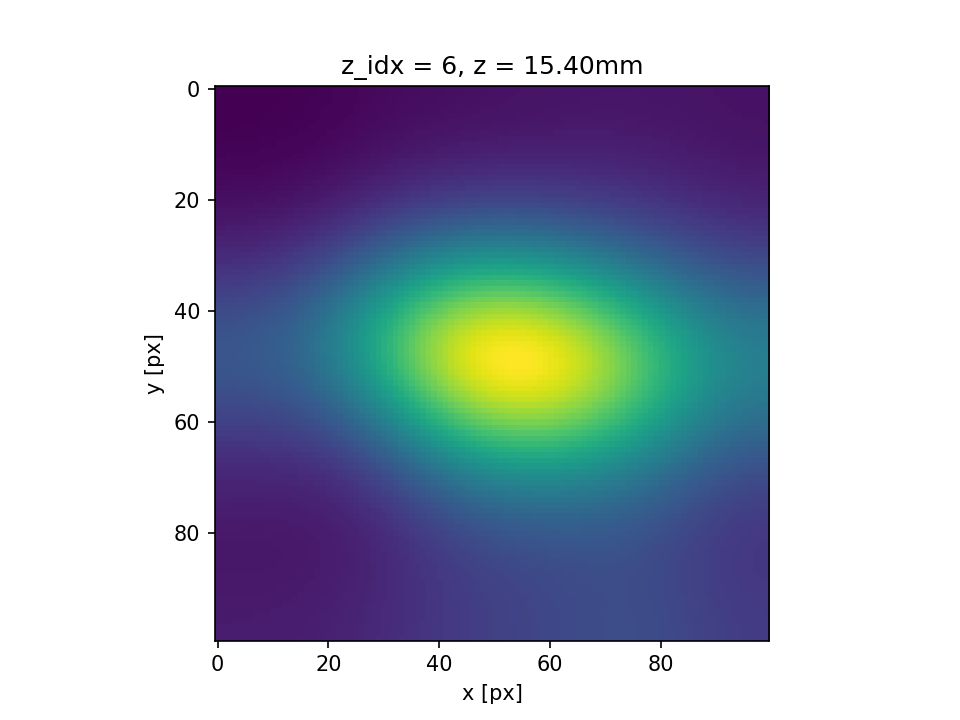

<IPython.core.display.Javascript object>


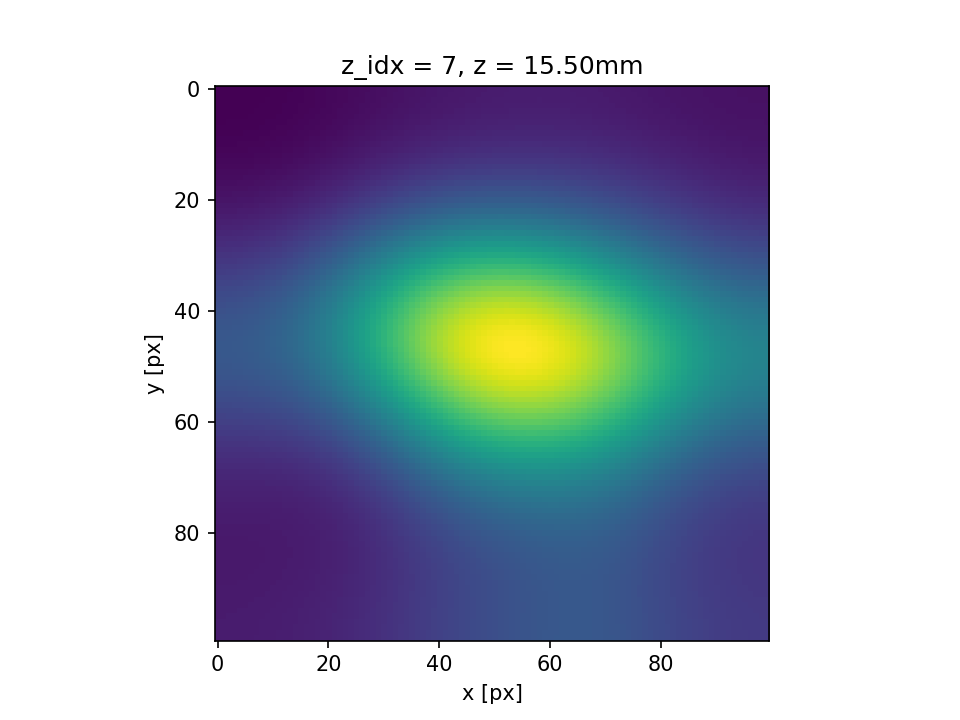

<IPython.core.display.Javascript object>


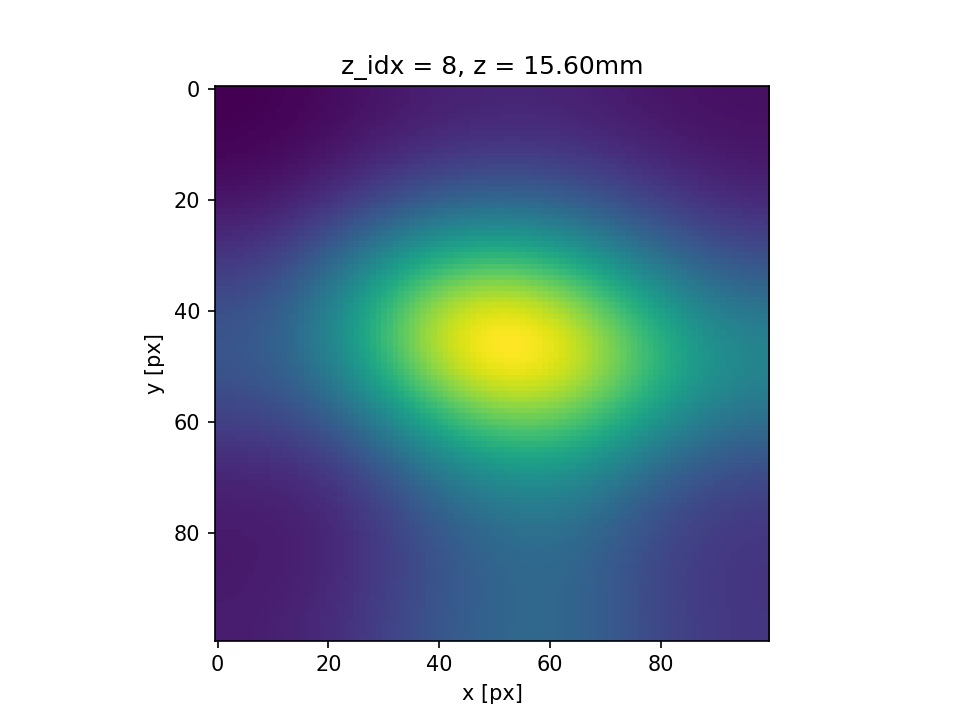

<IPython.core.display.Javascript object>


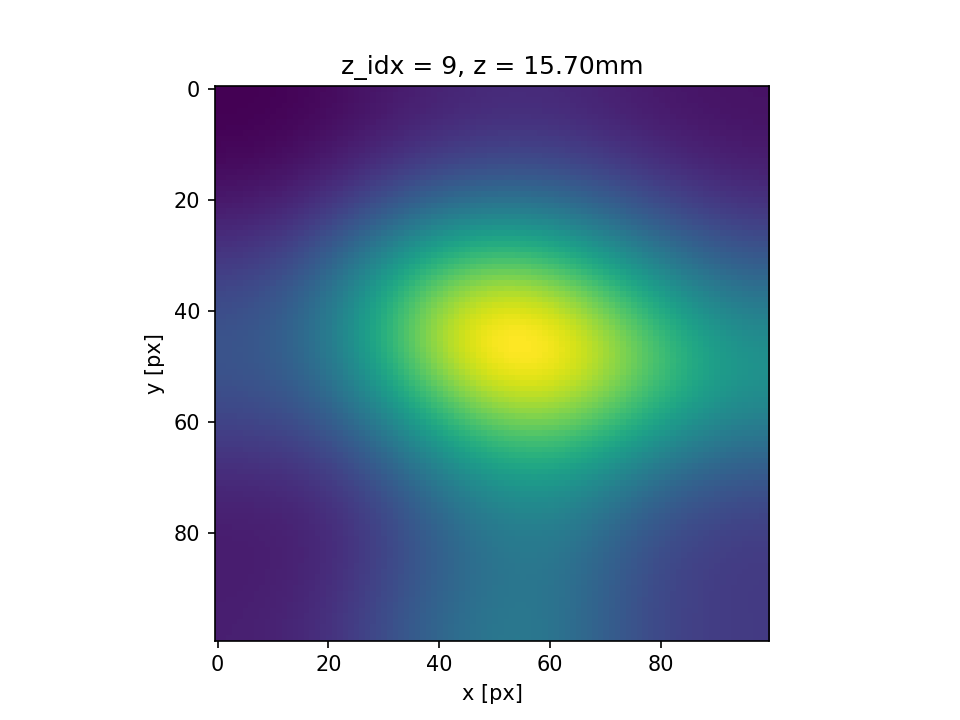

<IPython.core.display.Javascript object>


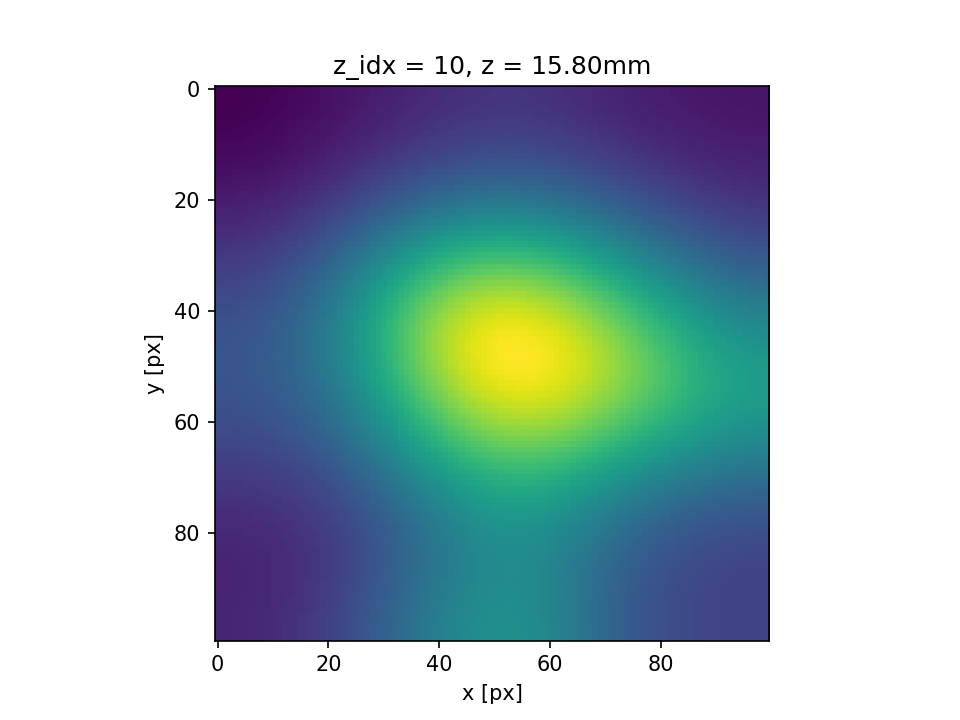

<IPython.core.display.Javascript object>


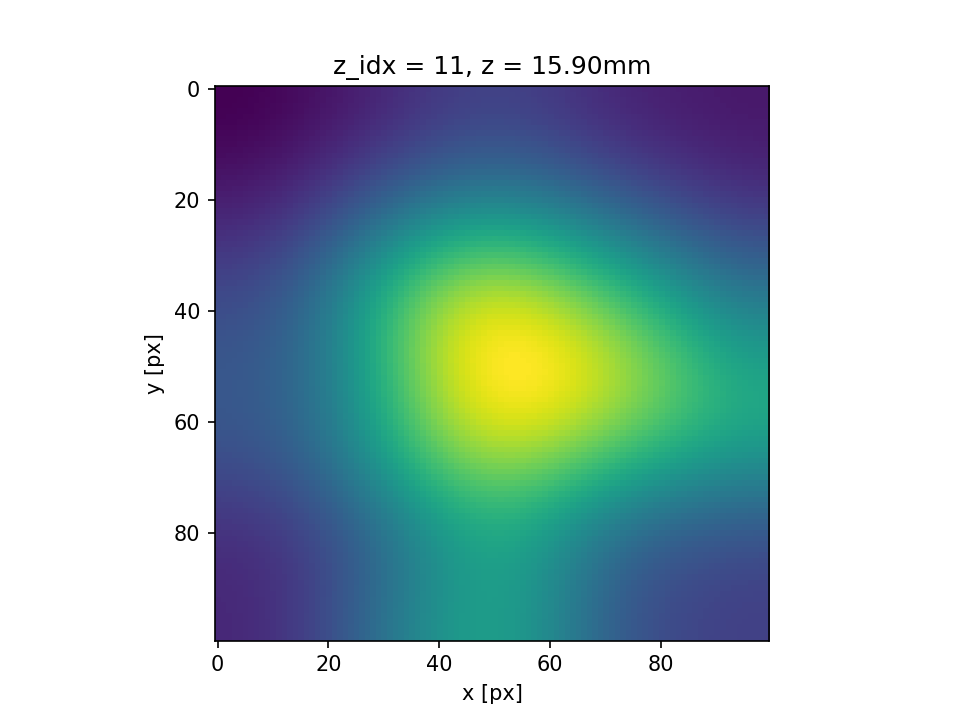

<IPython.core.display.Javascript object>


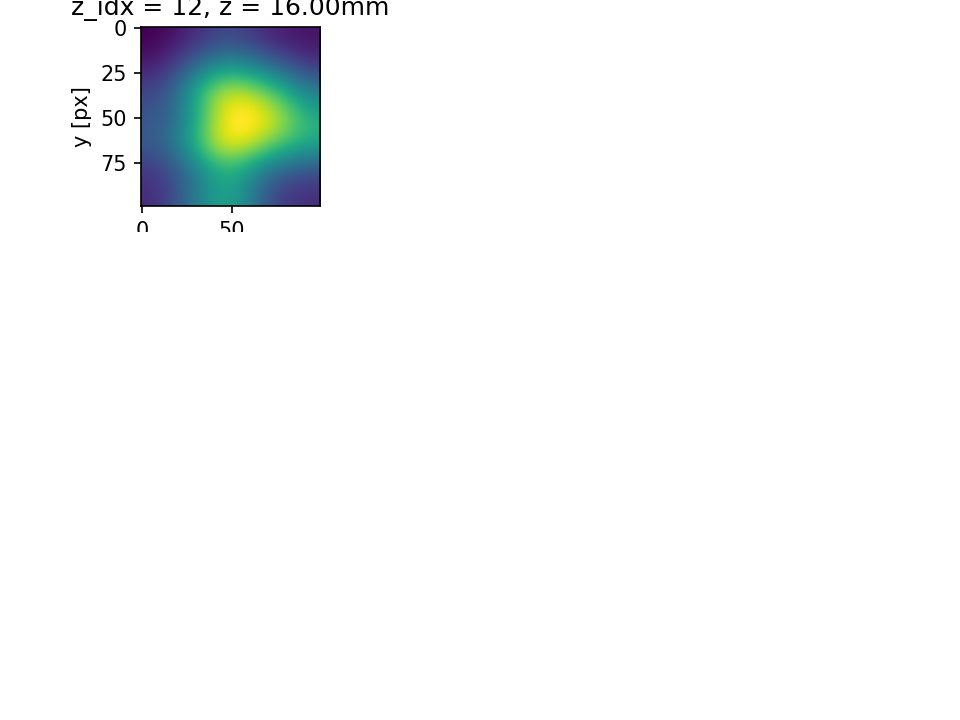

<IPython.core.display.Javascript object>


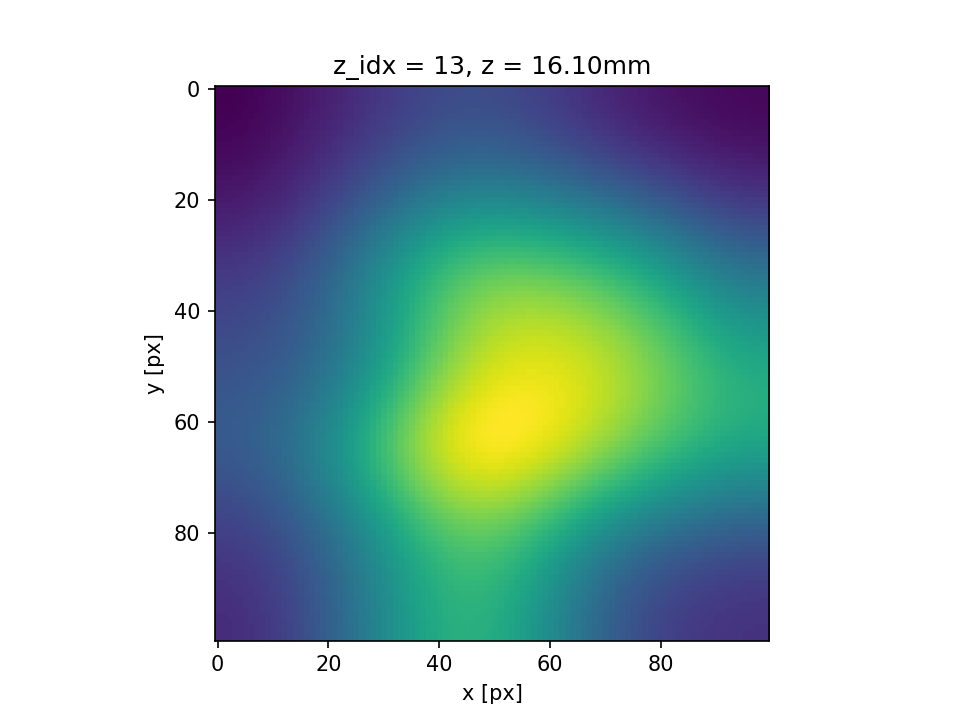

<IPython.core.display.Javascript object>


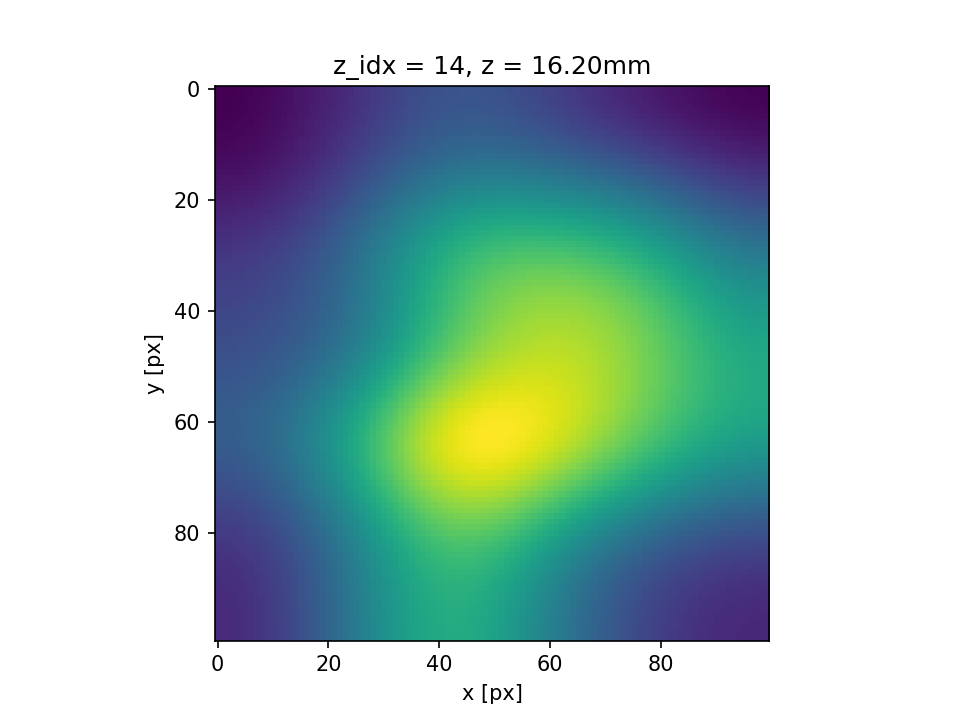

<IPython.core.display.Javascript object>


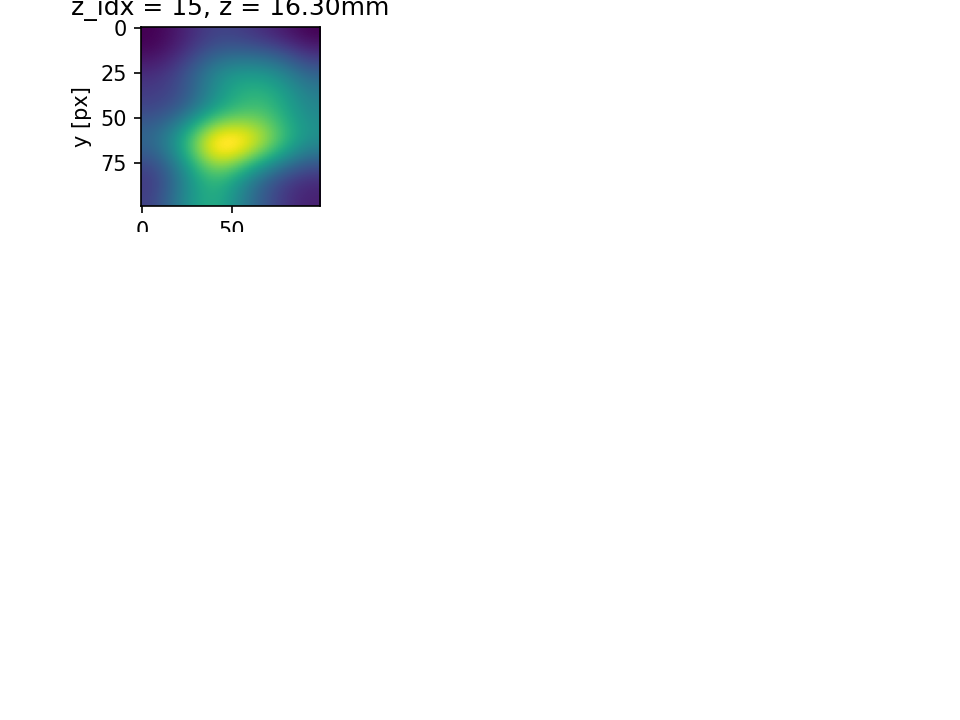

<IPython.core.display.Javascript object>


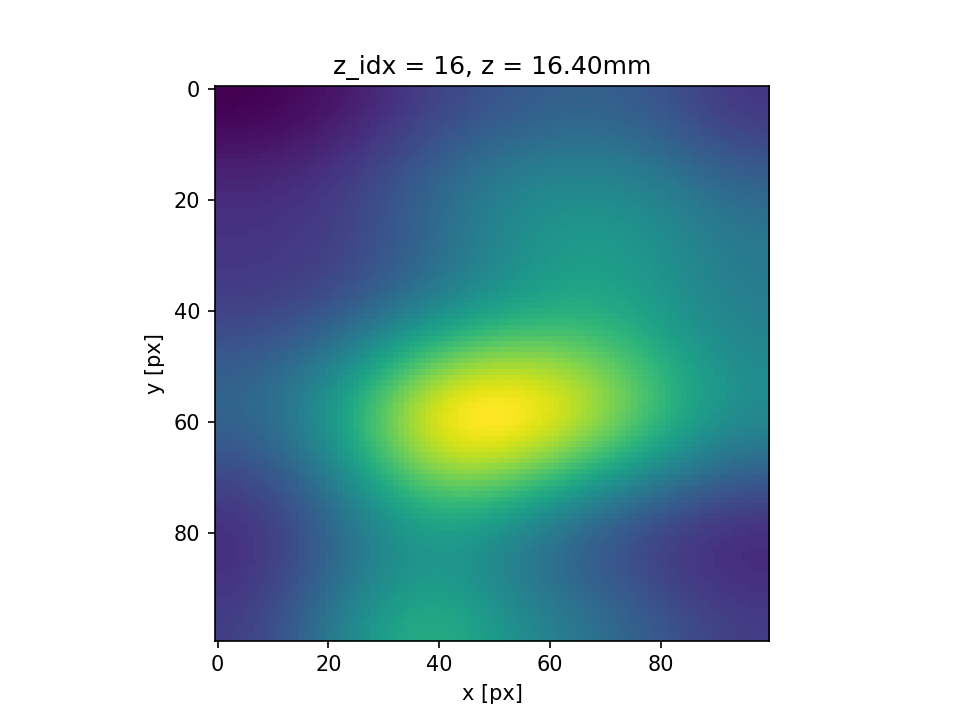

<IPython.core.display.Javascript object>


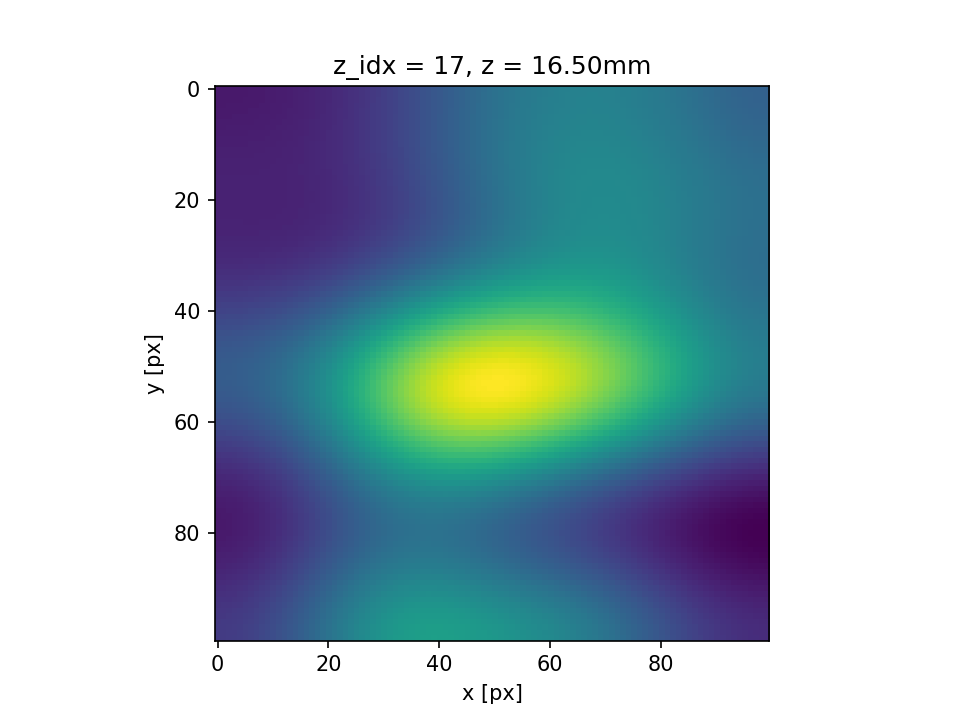

<IPython.core.display.Javascript object>


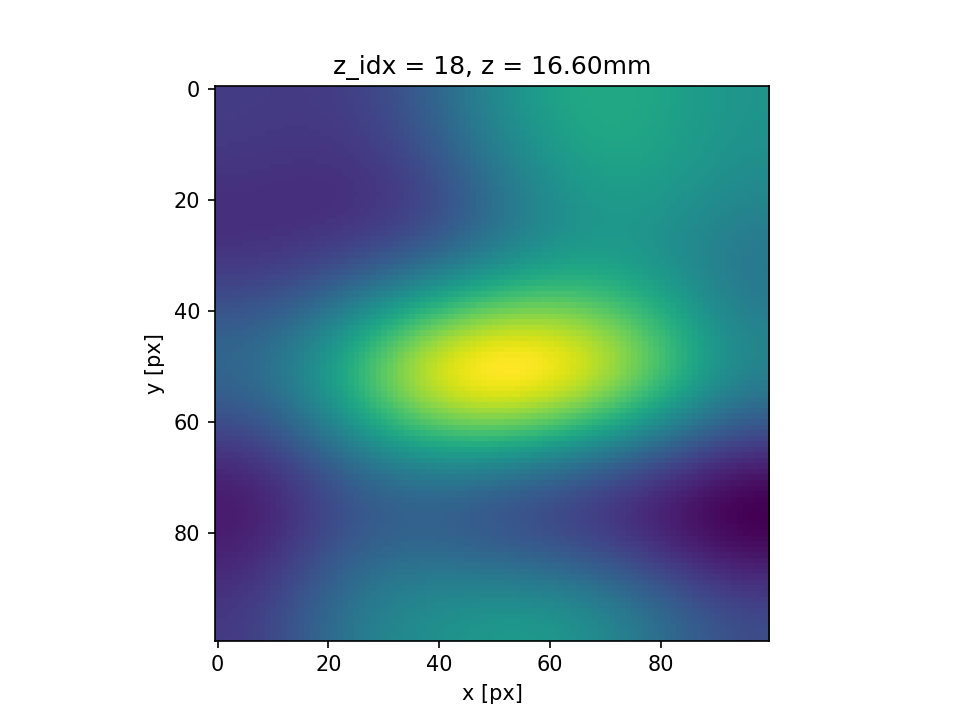

<IPython.core.display.Javascript object>


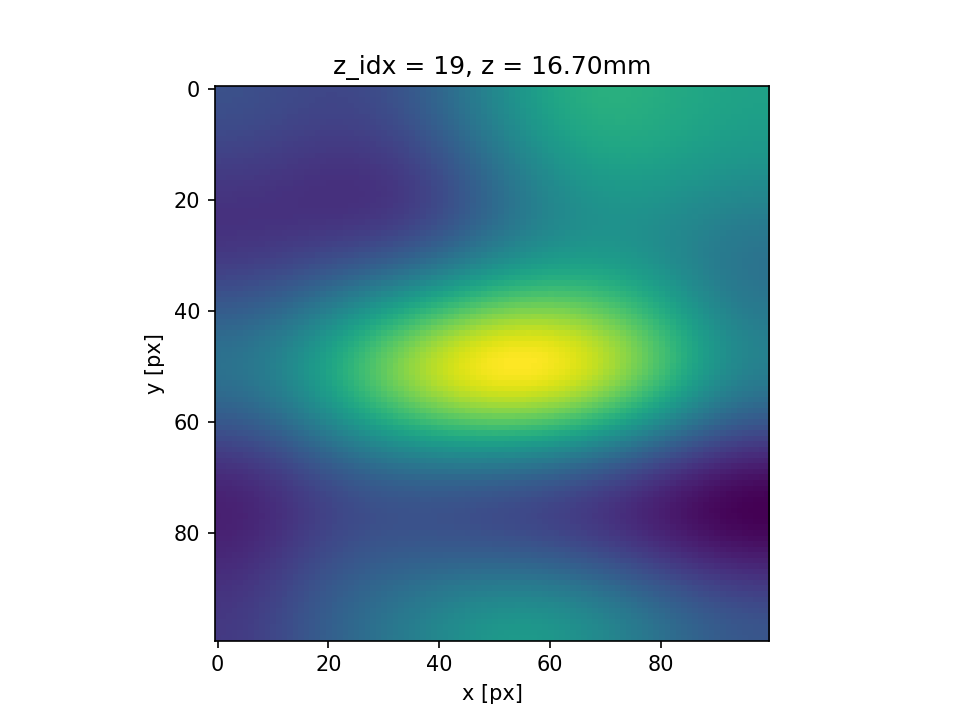

<IPython.core.display.Javascript object>


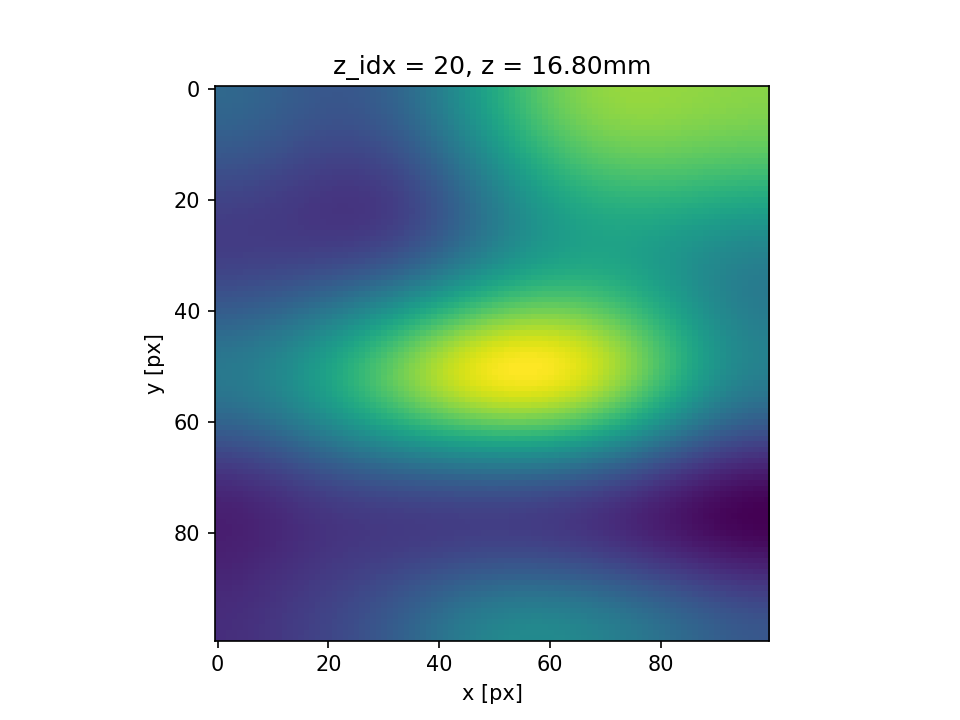

<IPython.core.display.Javascript object>


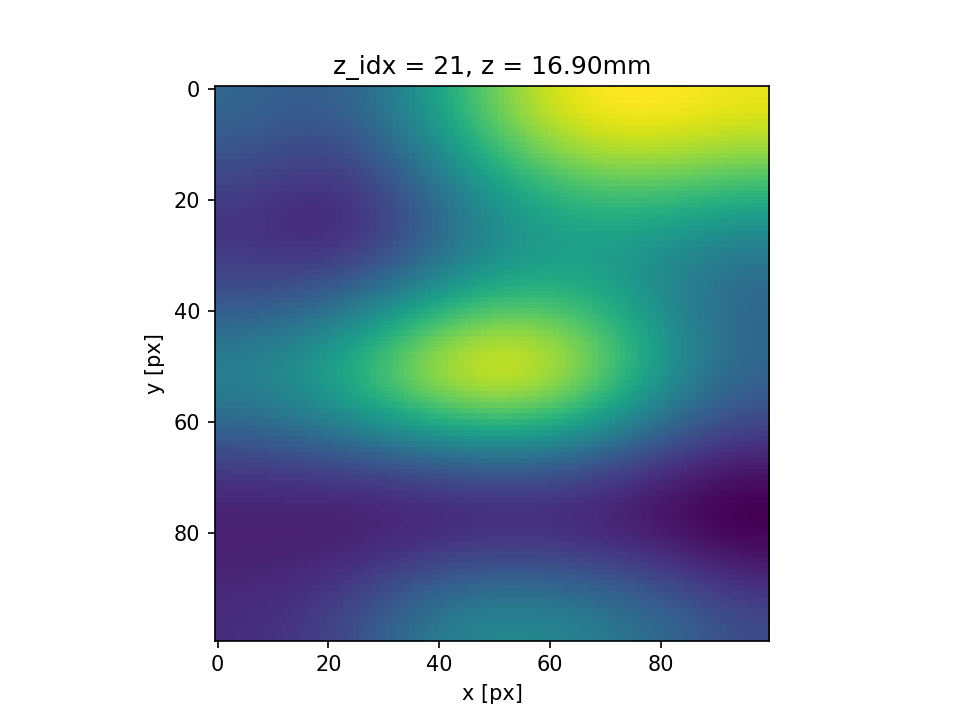

<IPython.core.display.Javascript object>


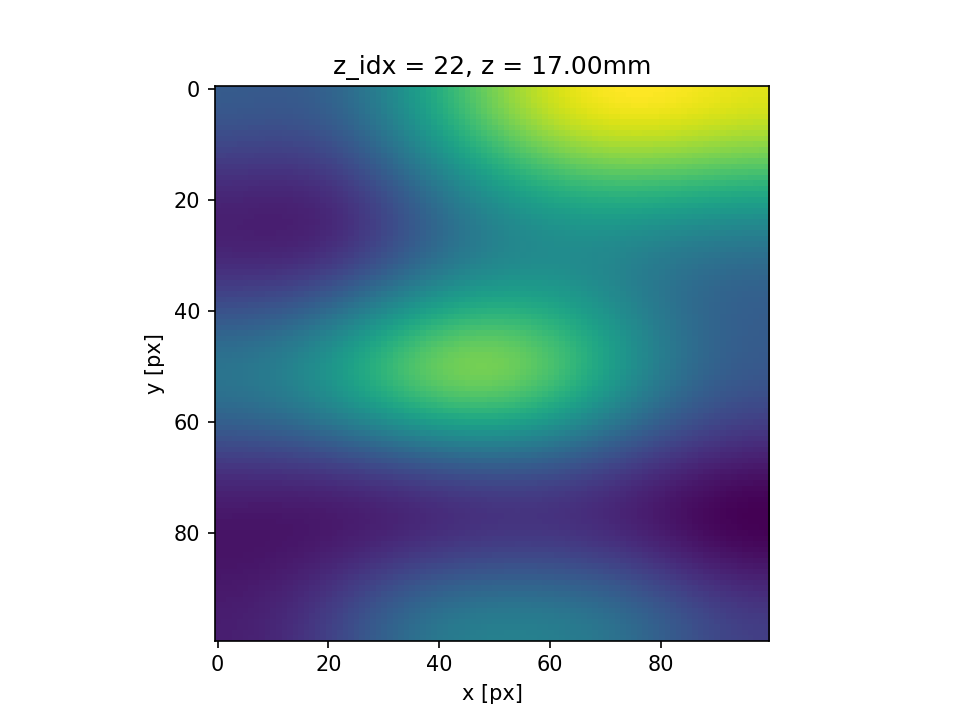

<IPython.core.display.Javascript object>


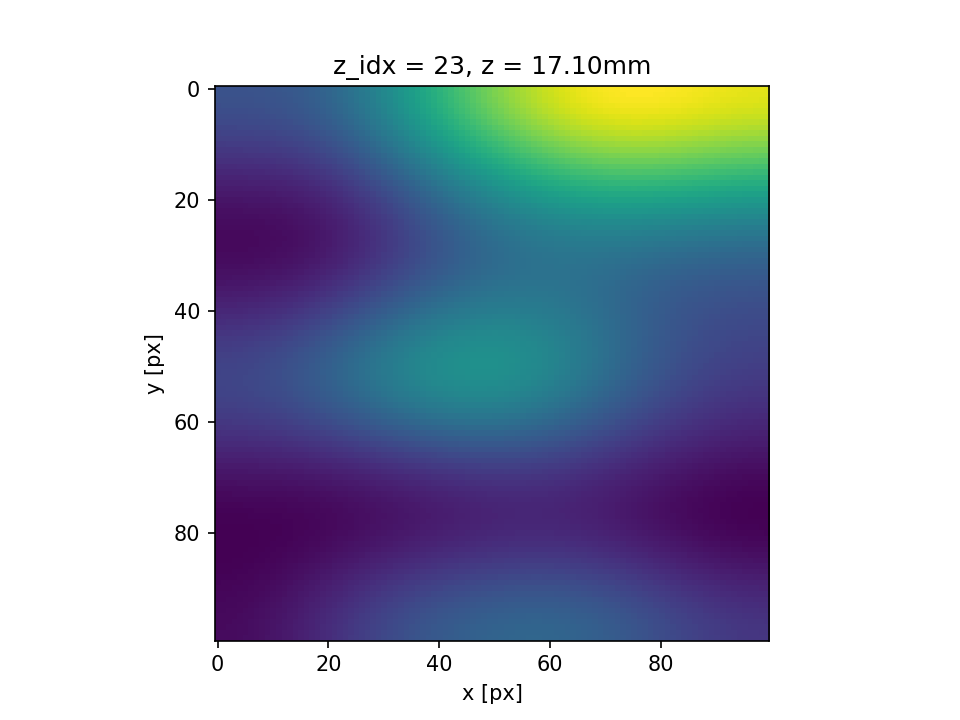

<IPython.core.display.Javascript object>


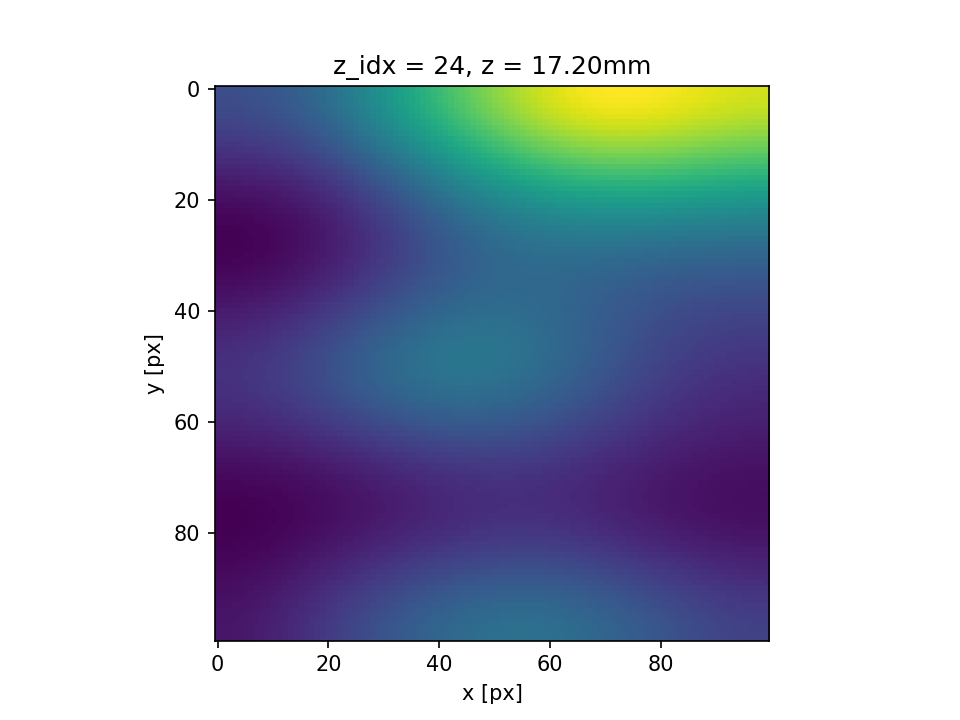

<IPython.core.display.Javascript object>


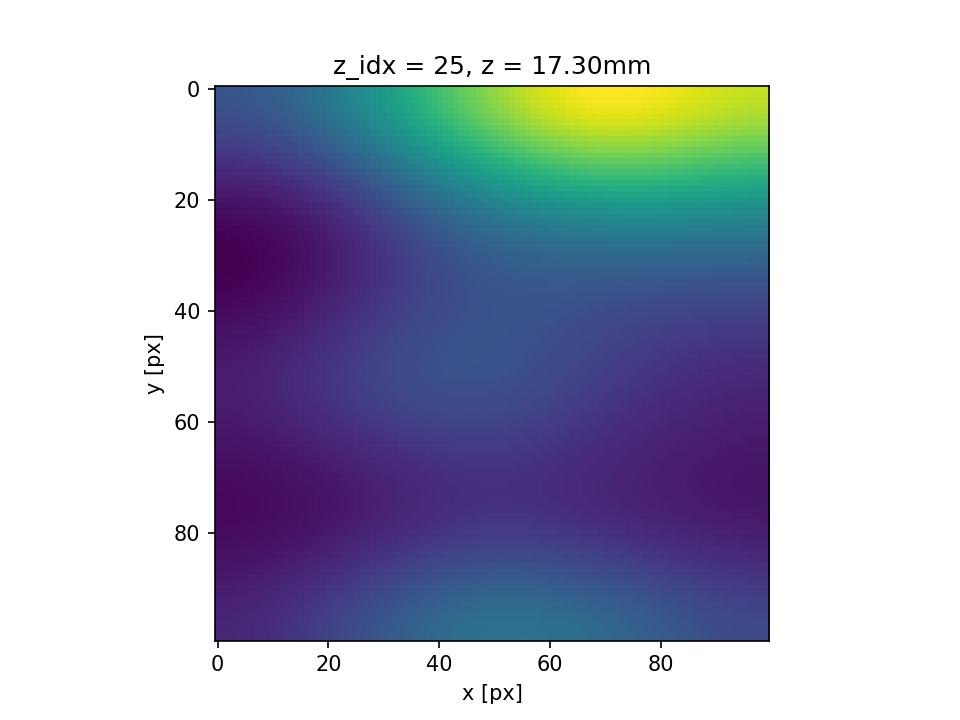

<IPython.core.display.Javascript object>


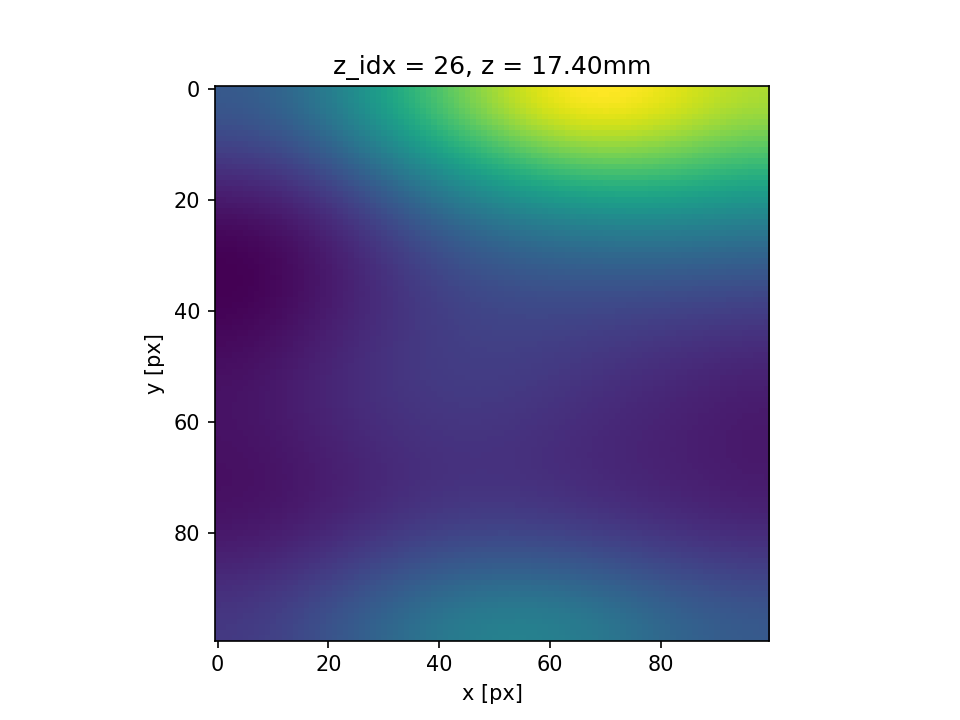

<IPython.core.display.Javascript object>


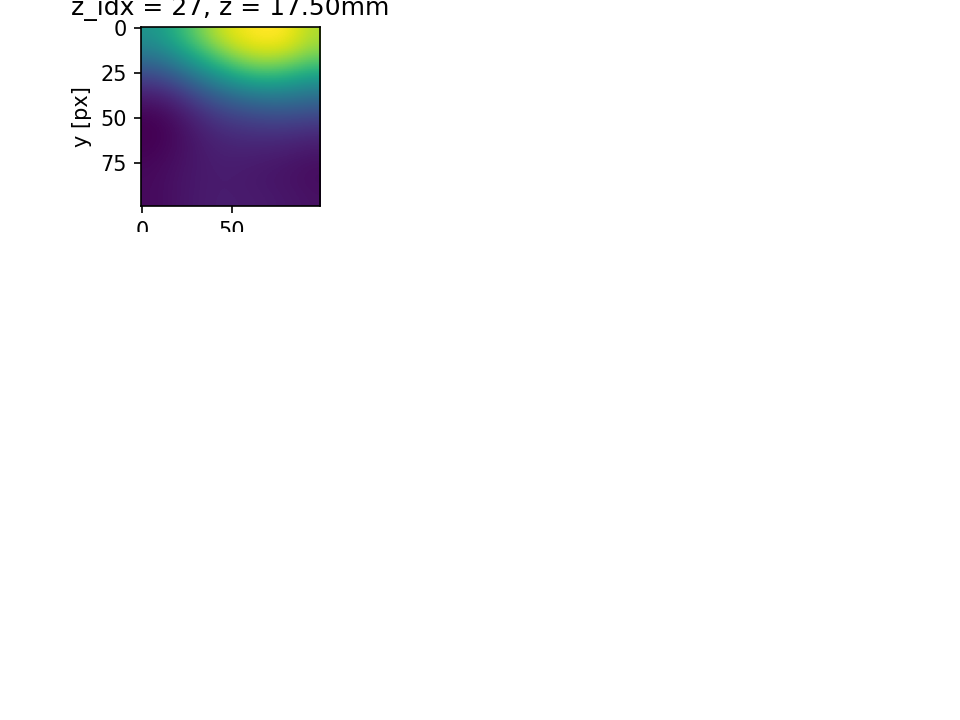

<IPython.core.display.Javascript object>


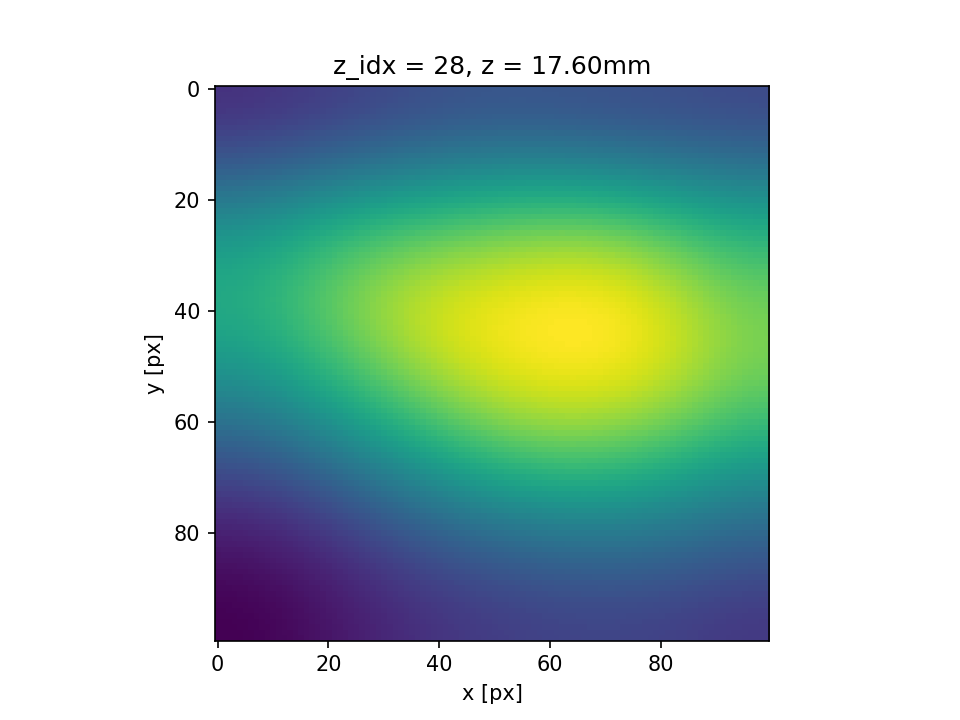

<IPython.core.display.Javascript object>


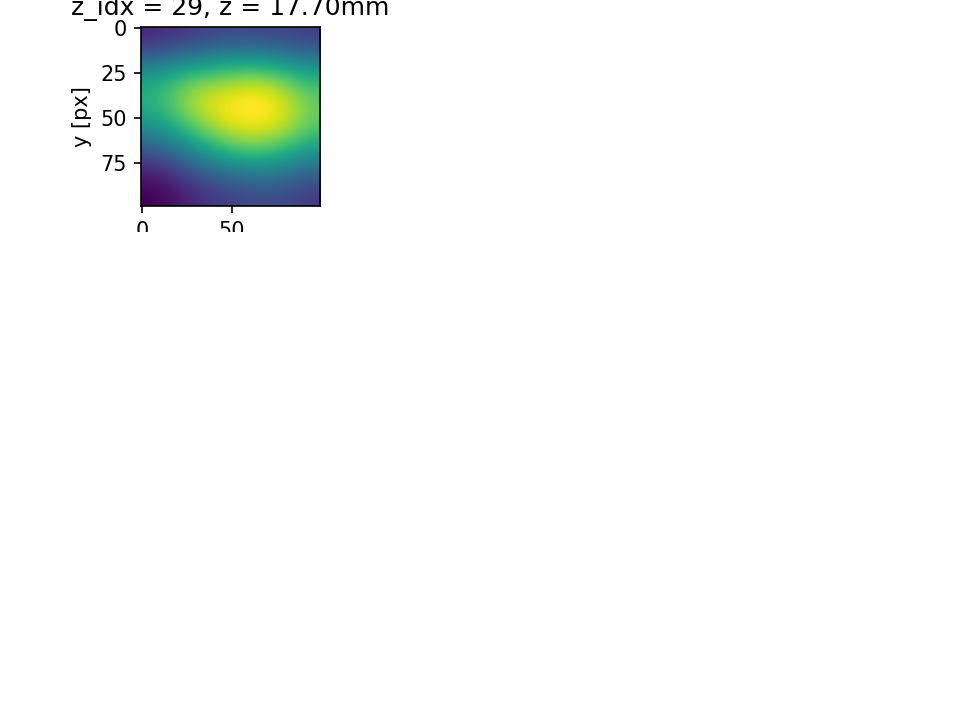

<IPython.core.display.Javascript object>


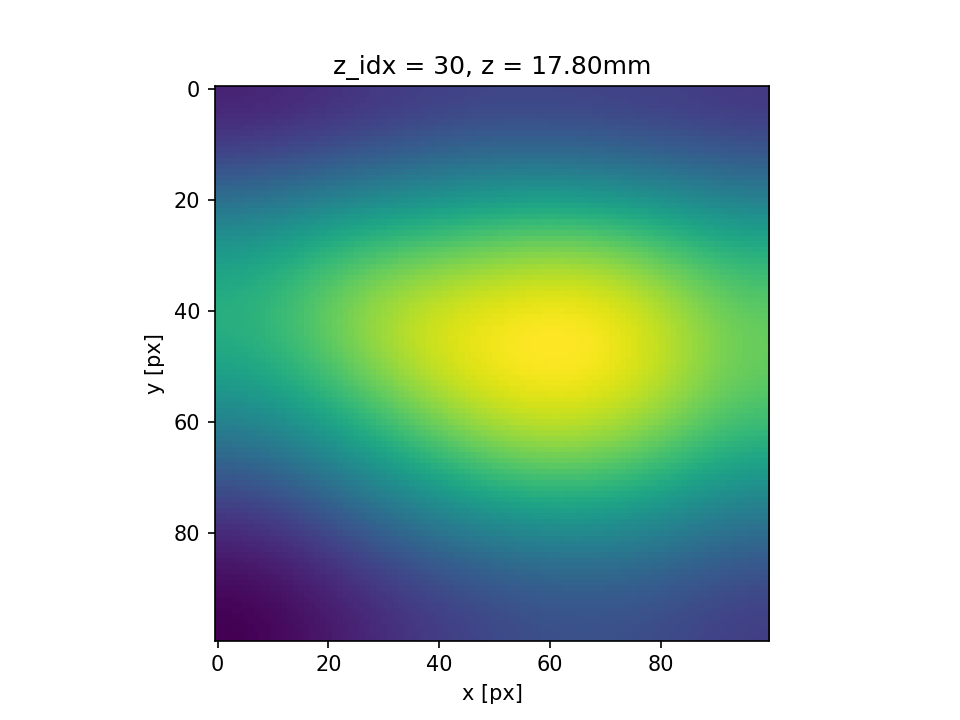

<IPython.core.display.Javascript object>


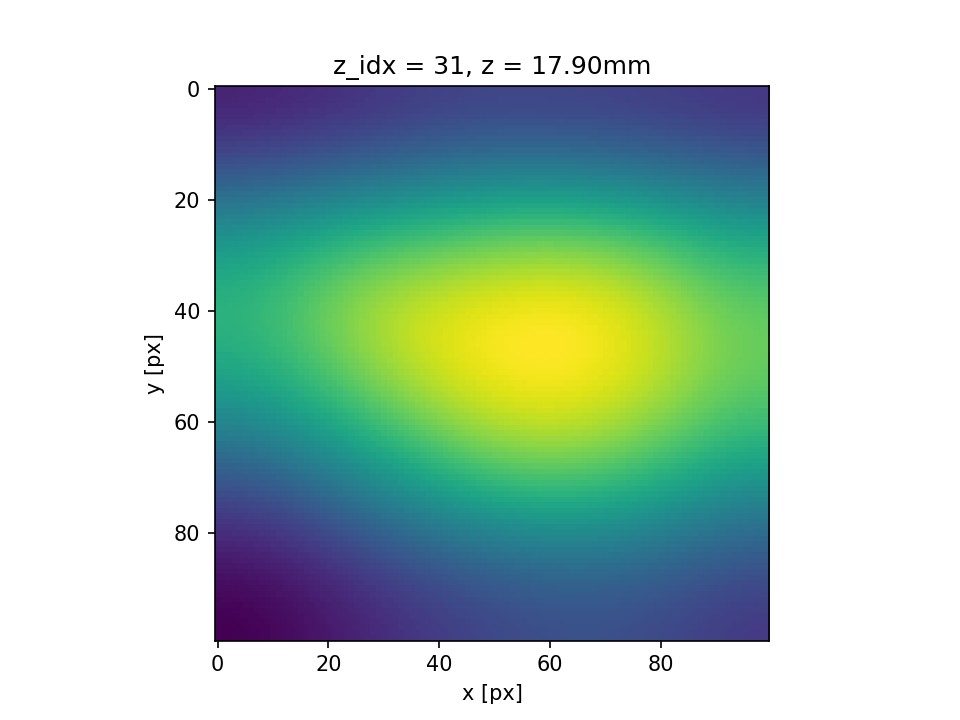

<IPython.core.display.Javascript object>


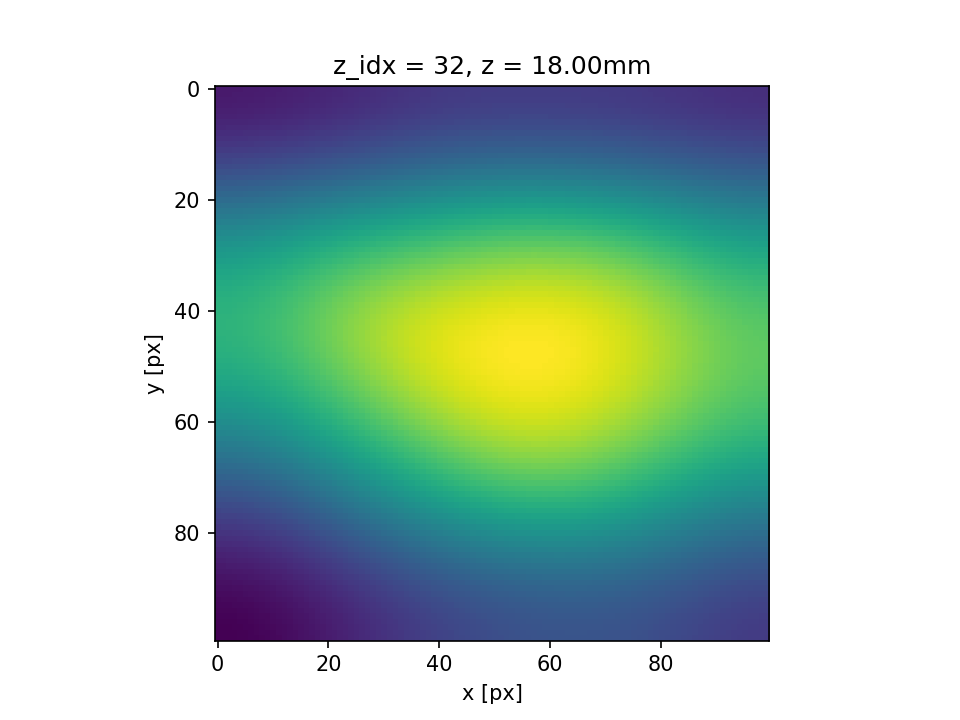

<IPython.core.display.Javascript object>


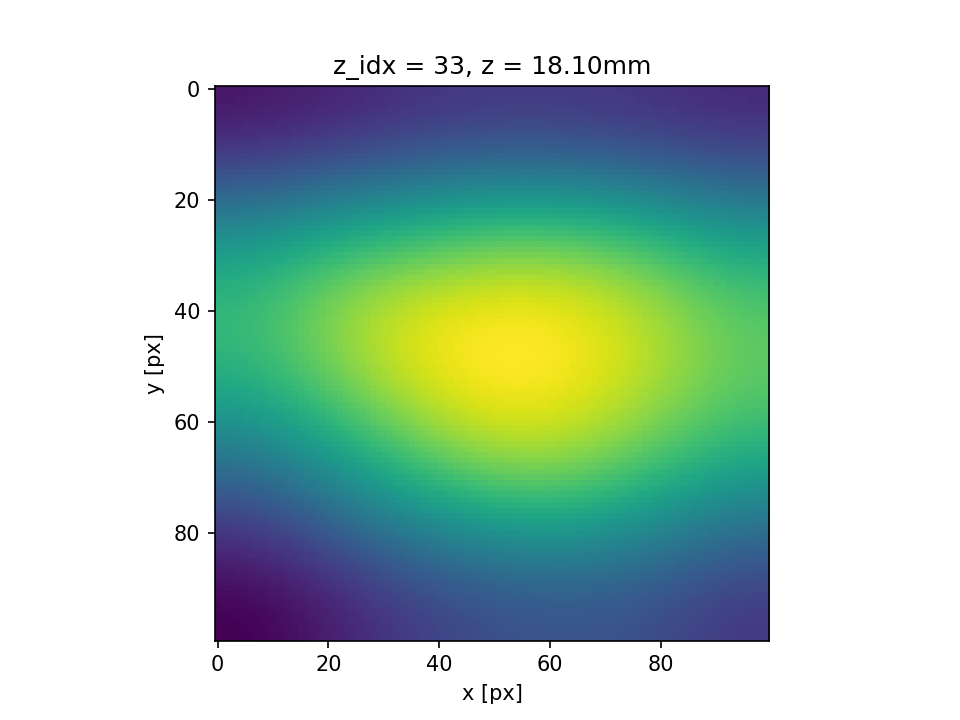

<IPython.core.display.Javascript object>


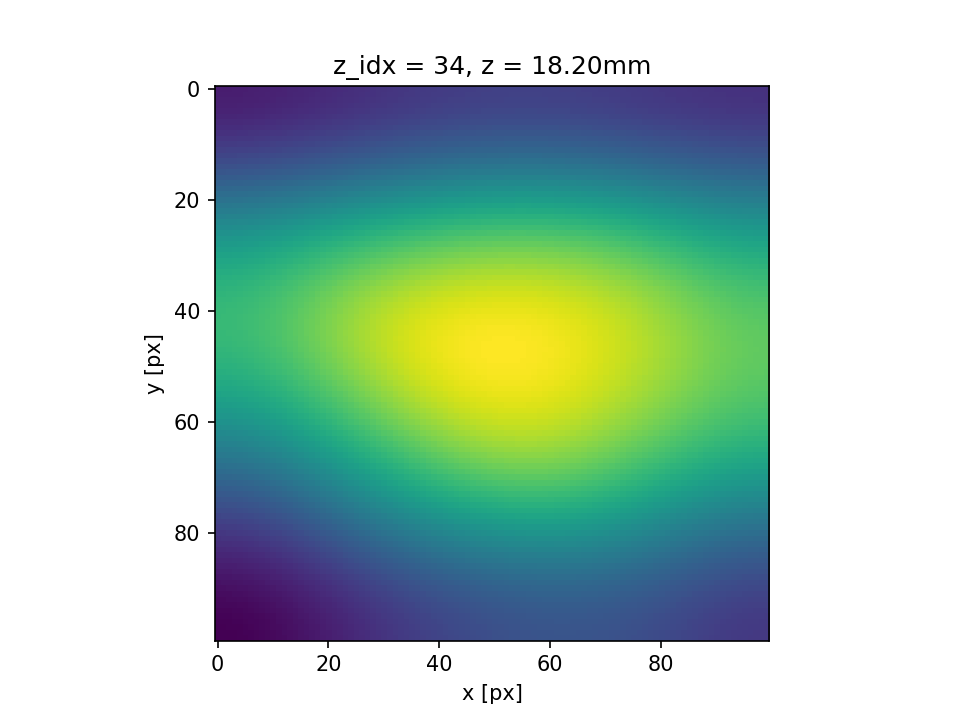

<IPython.core.display.Javascript object>


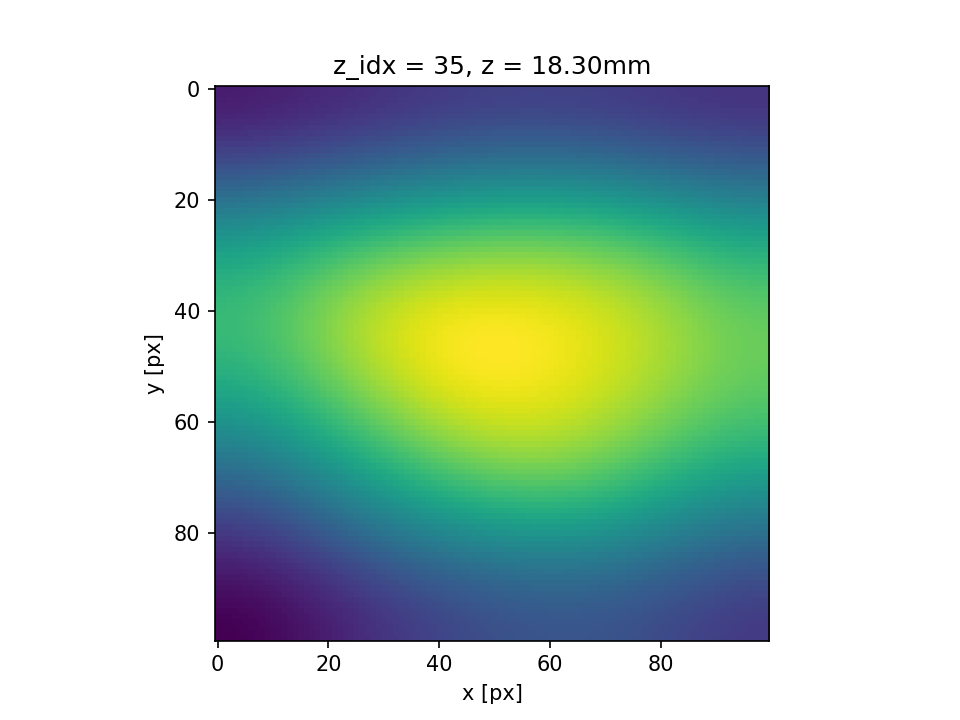

<IPython.core.display.Javascript object>


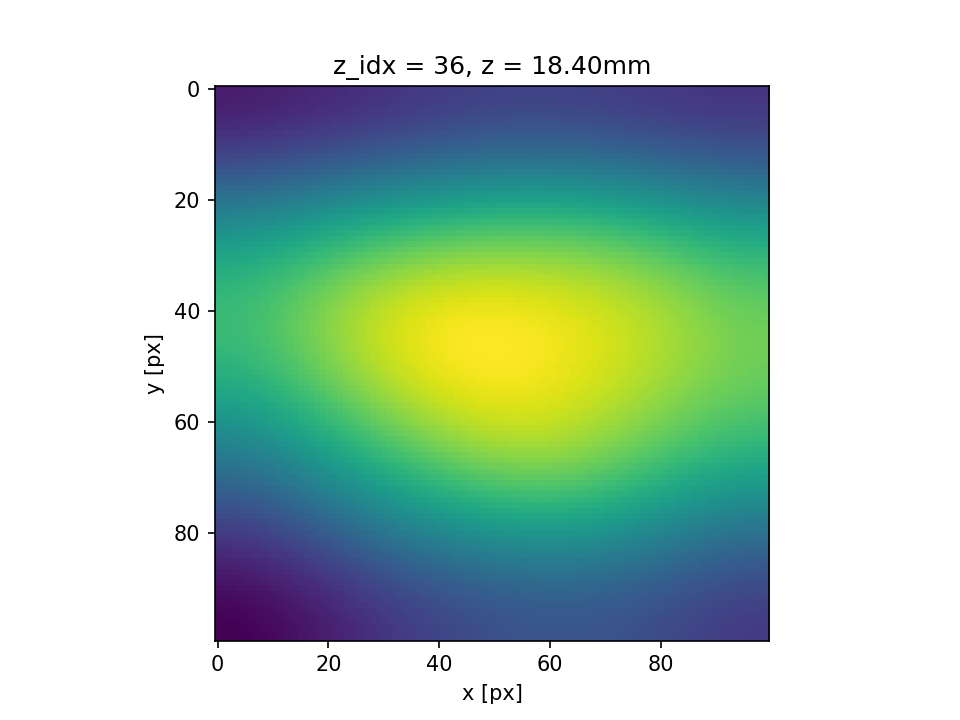

<IPython.core.display.Javascript object>


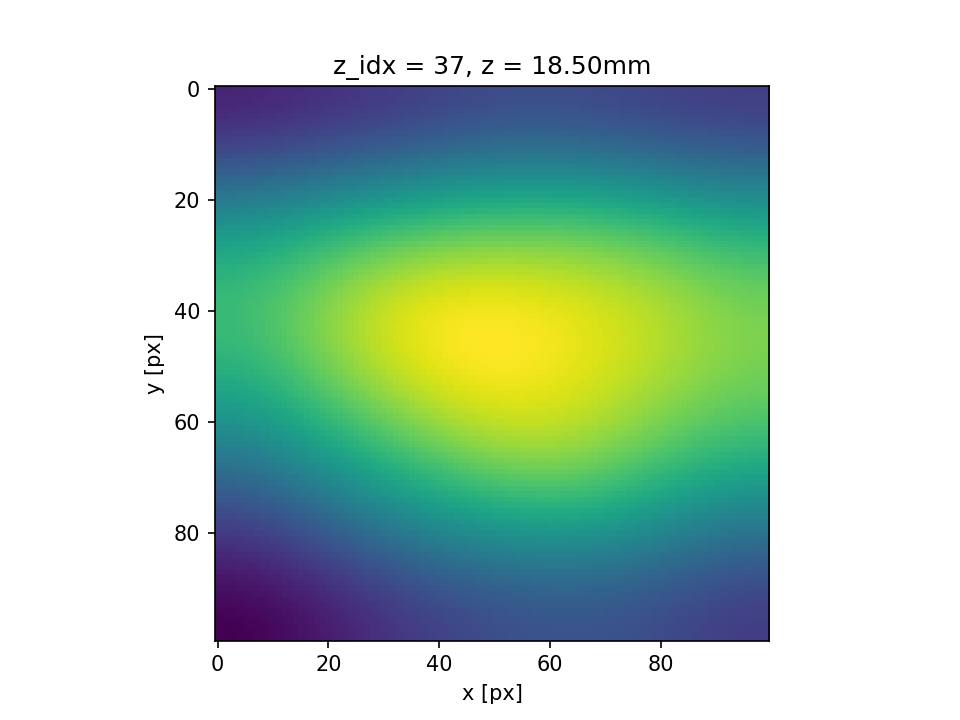

<IPython.core.display.Javascript object>


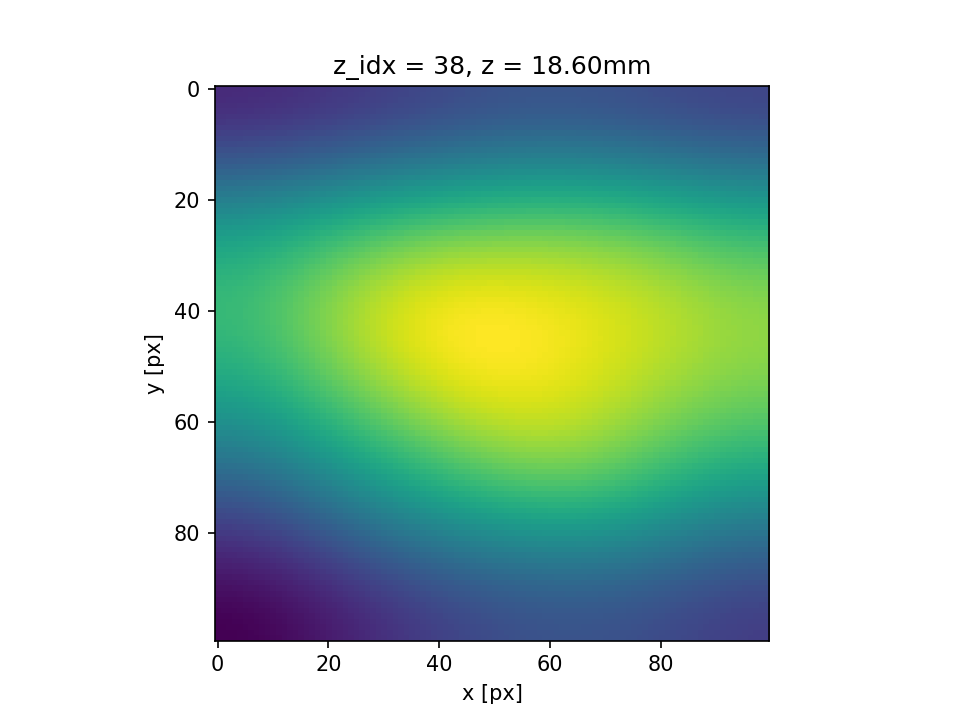

<IPython.core.display.Javascript object>


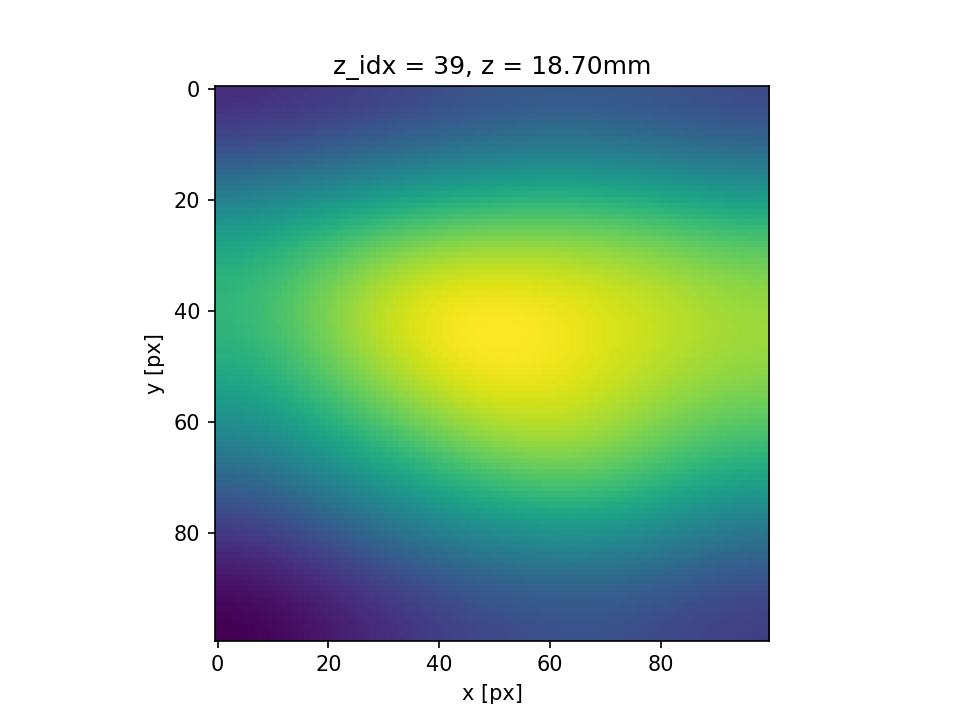

In [13]:
id_x = 0
id_y = 1
beam_i =tomo.beam_l[id_x][id_y]
beam_i.plot_rois()
    

## Plot ROIs and respective gaussian fits

<IPython.core.display.Javascript object>


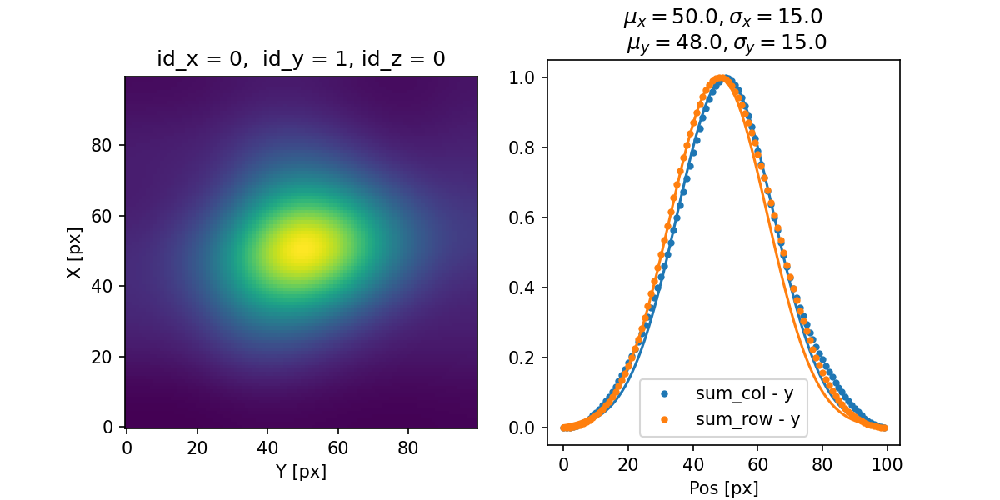

<IPython.core.display.Javascript object>


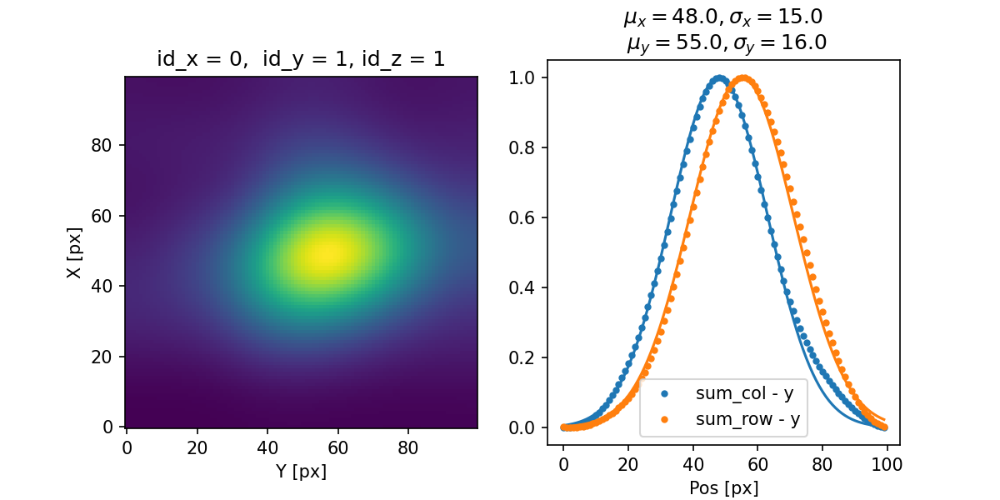

<IPython.core.display.Javascript object>


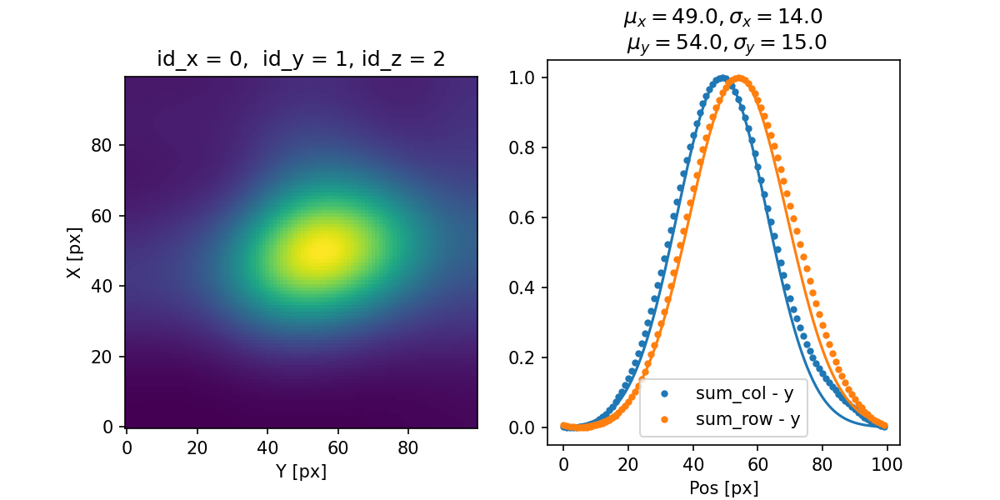

<IPython.core.display.Javascript object>


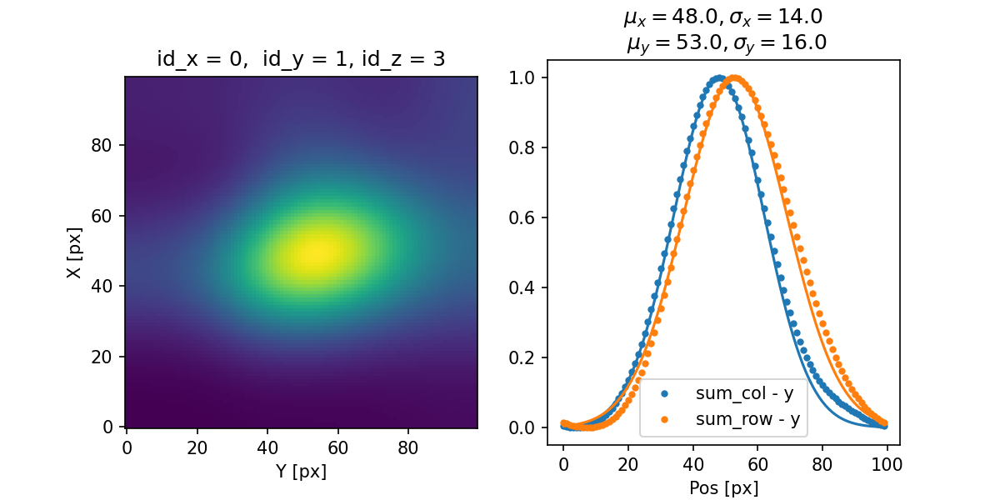

<IPython.core.display.Javascript object>


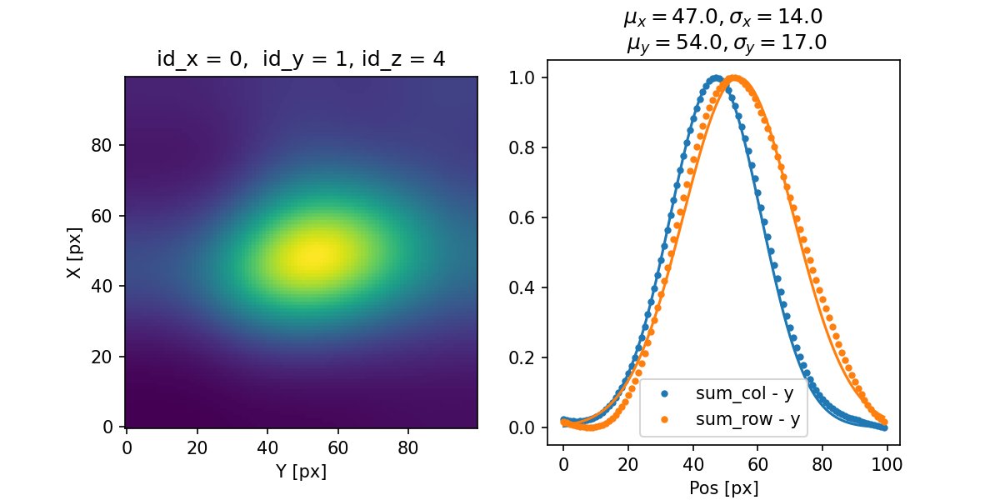

<IPython.core.display.Javascript object>


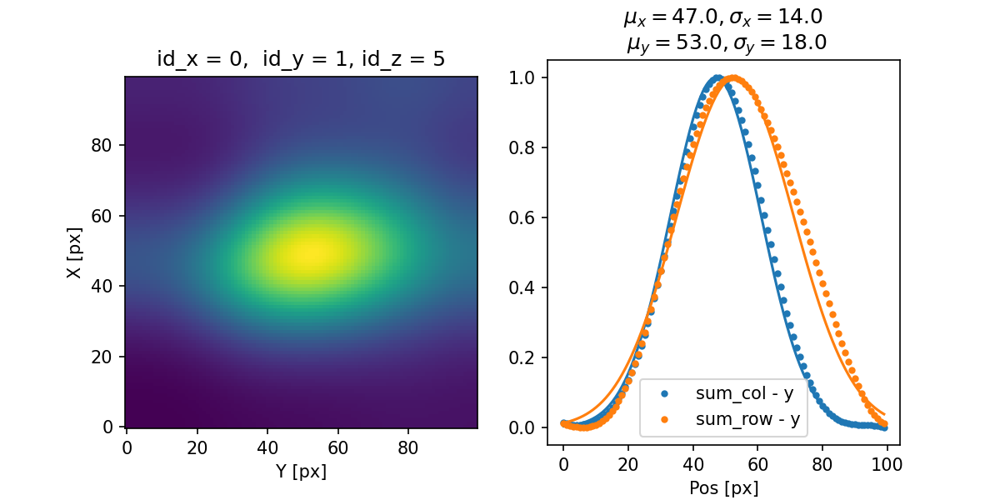

<IPython.core.display.Javascript object>


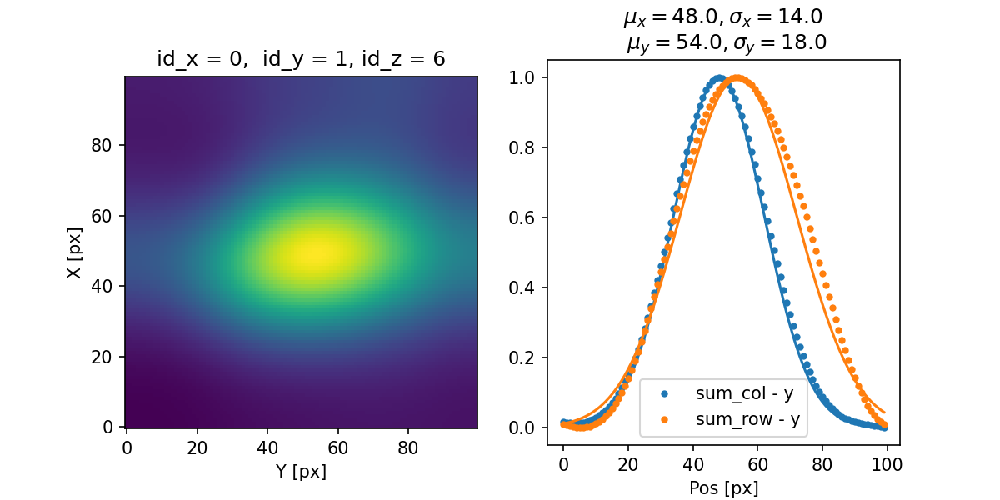

<IPython.core.display.Javascript object>


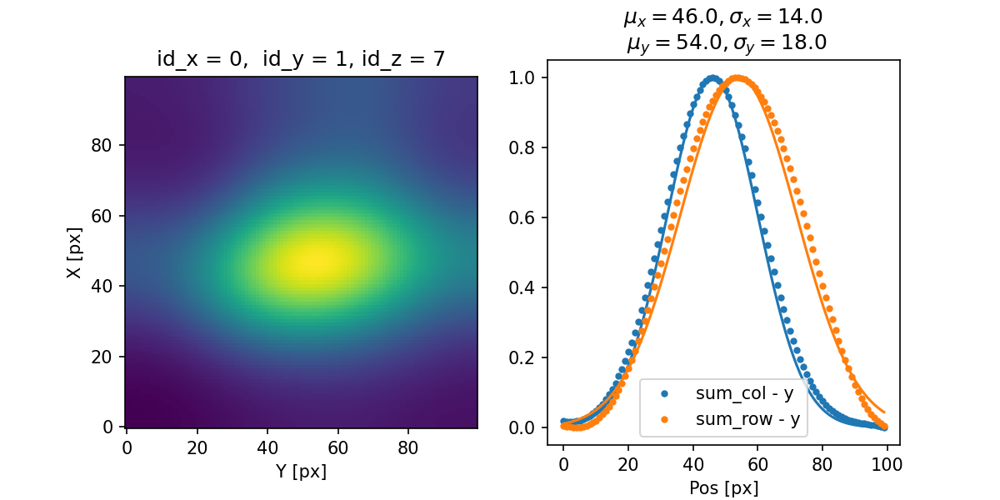

<IPython.core.display.Javascript object>


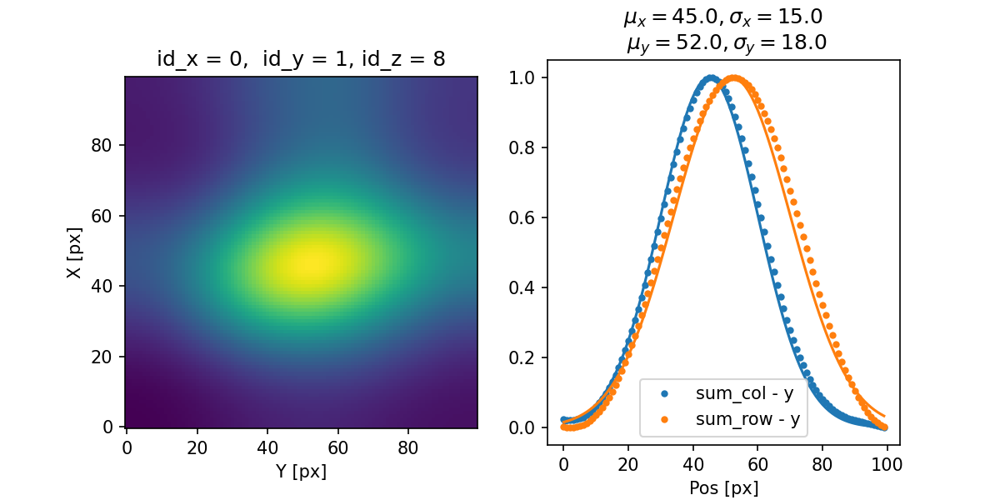

<IPython.core.display.Javascript object>


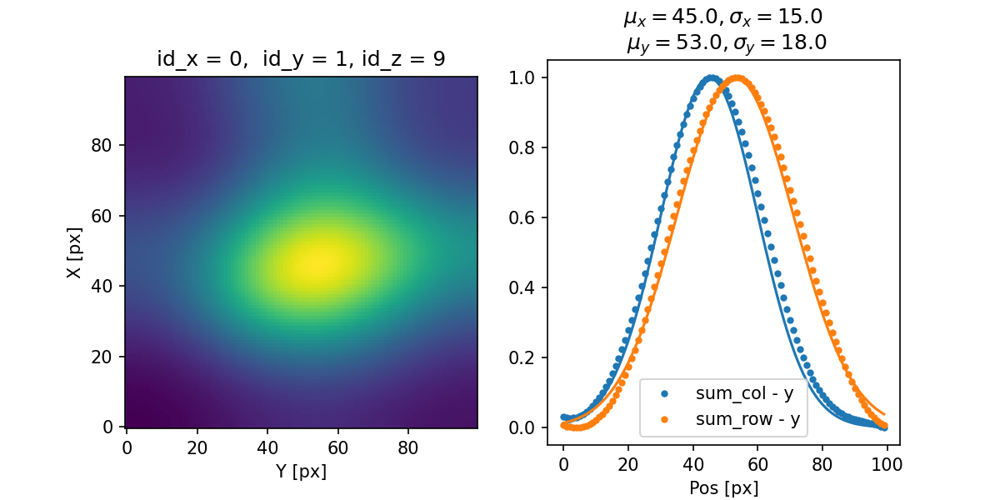

<IPython.core.display.Javascript object>


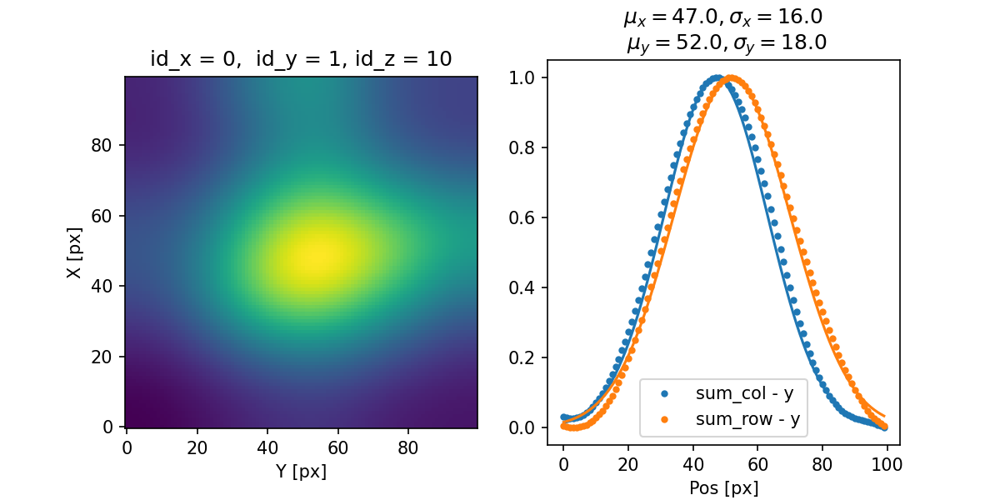

<IPython.core.display.Javascript object>


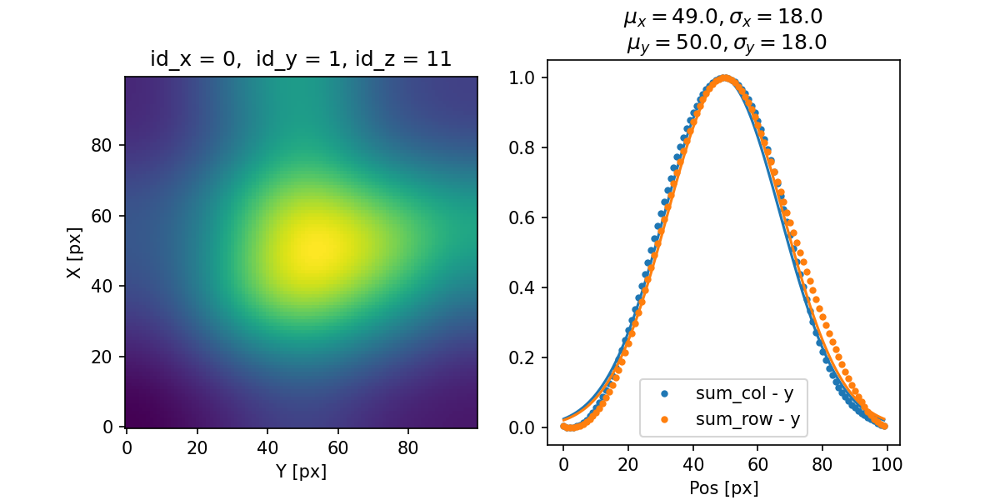

<IPython.core.display.Javascript object>


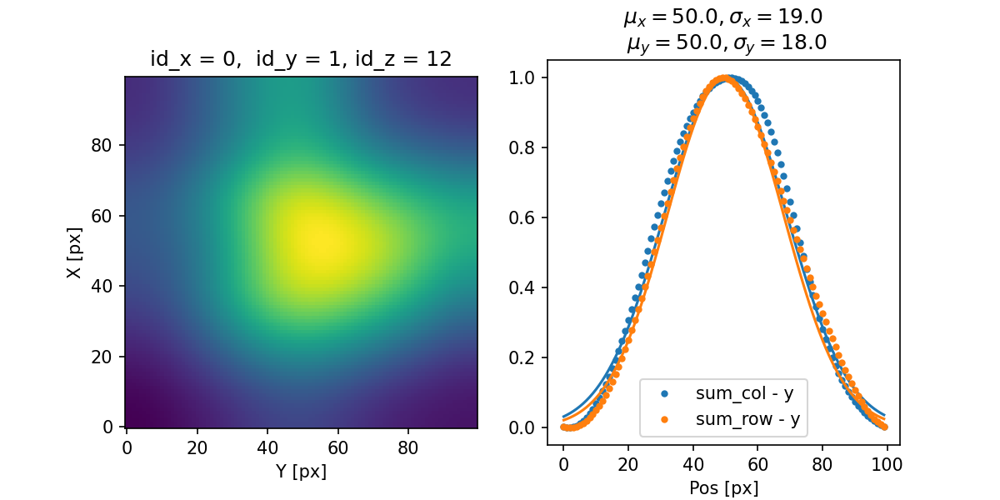

<IPython.core.display.Javascript object>


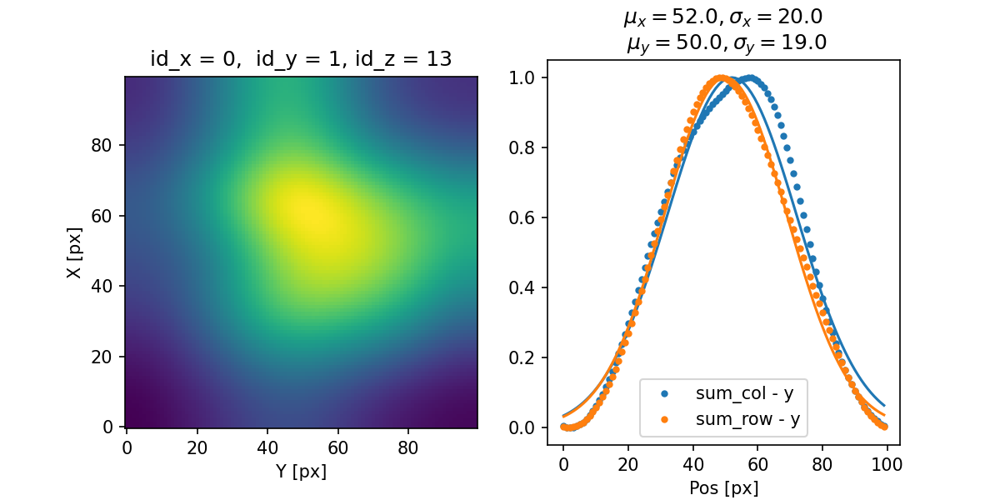

<IPython.core.display.Javascript object>


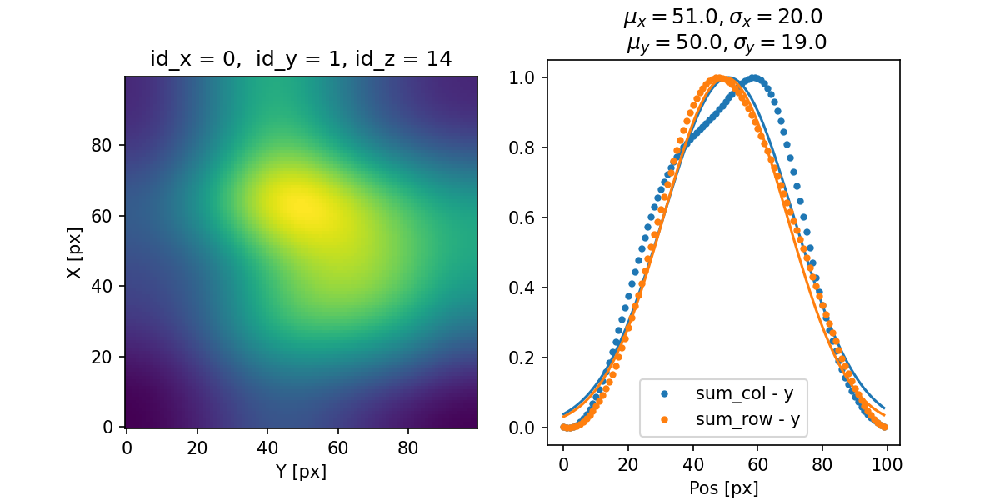

<IPython.core.display.Javascript object>


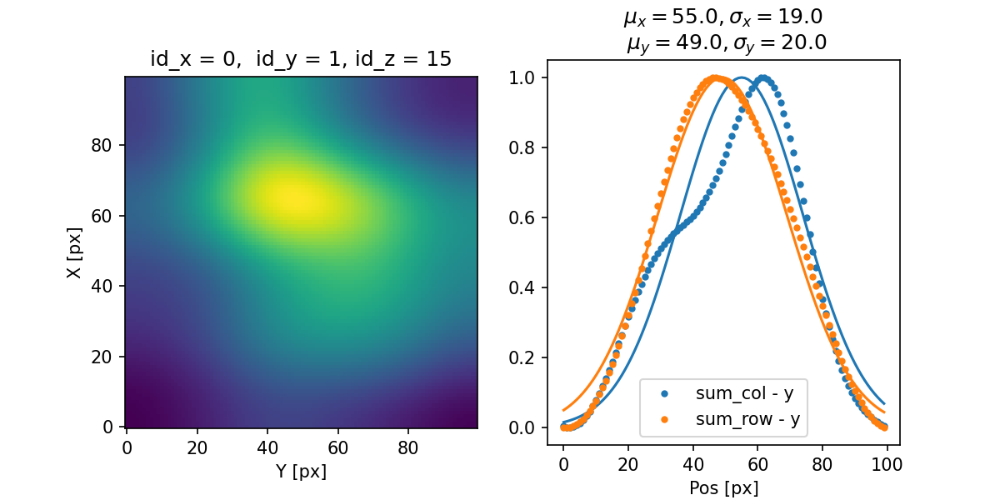

<IPython.core.display.Javascript object>


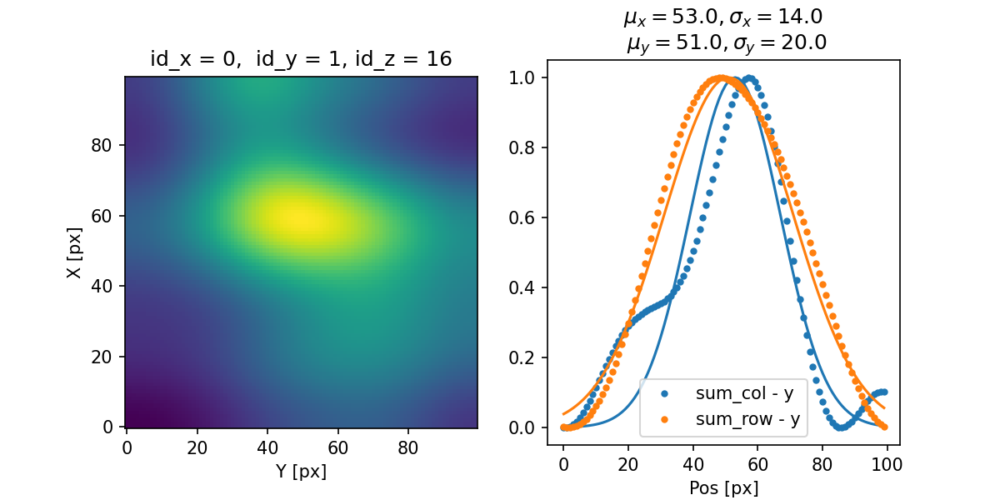

<IPython.core.display.Javascript object>


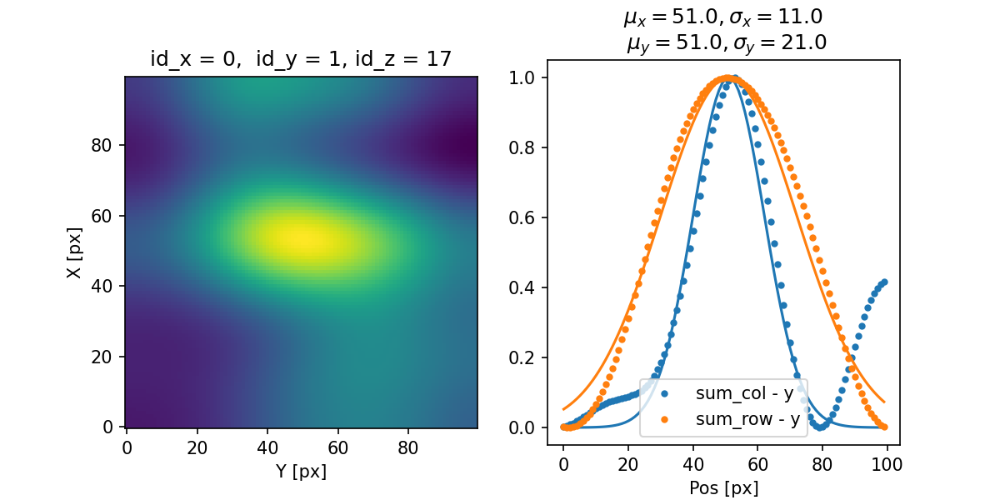

<IPython.core.display.Javascript object>


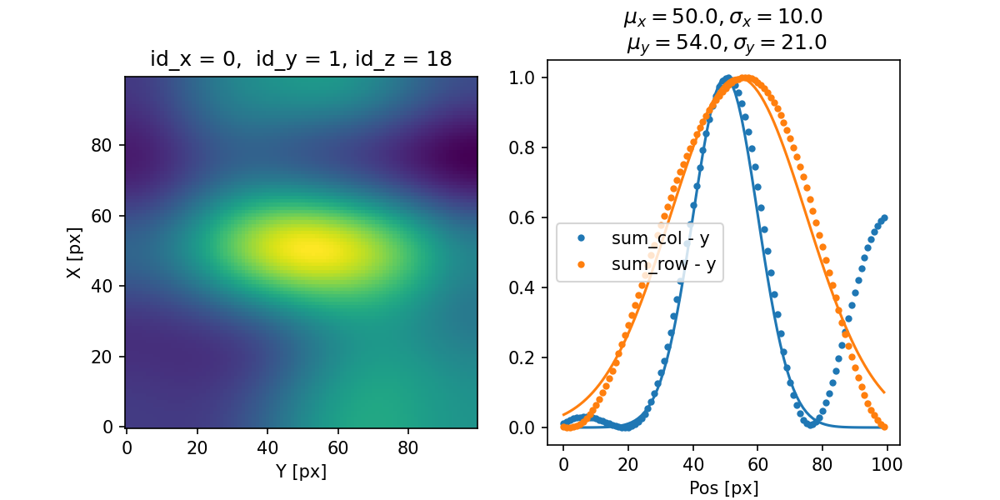

<IPython.core.display.Javascript object>


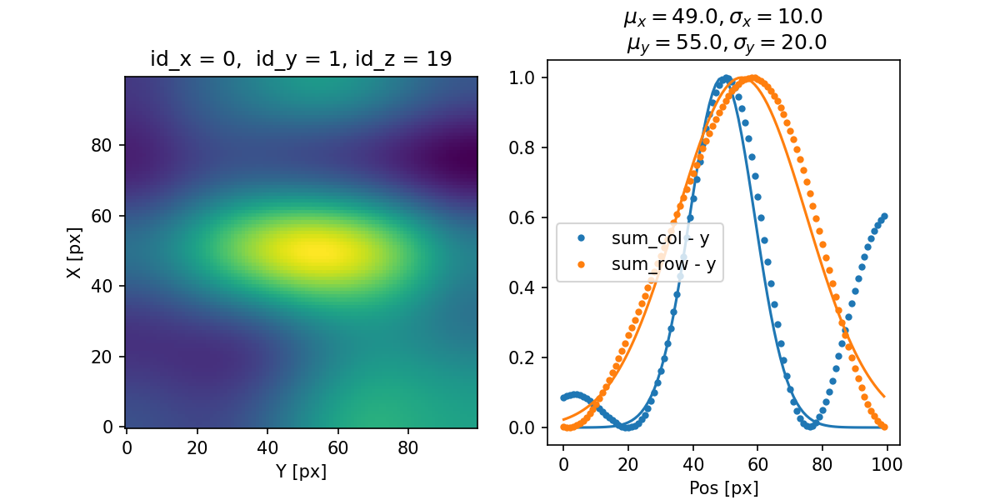

<IPython.core.display.Javascript object>


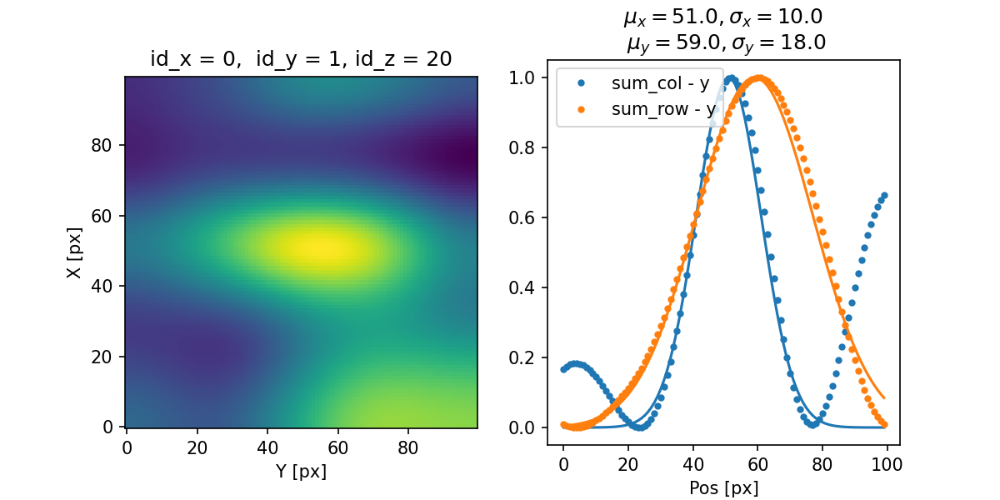

<IPython.core.display.Javascript object>


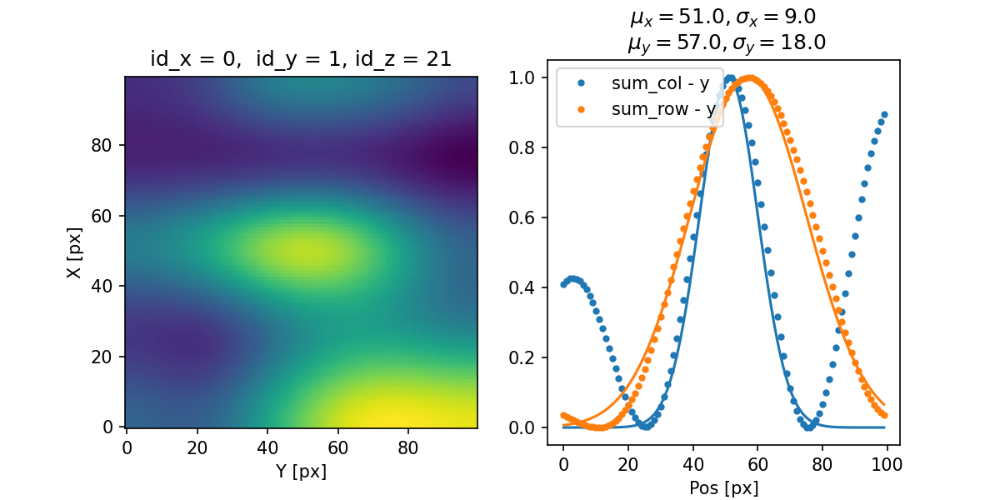

<IPython.core.display.Javascript object>


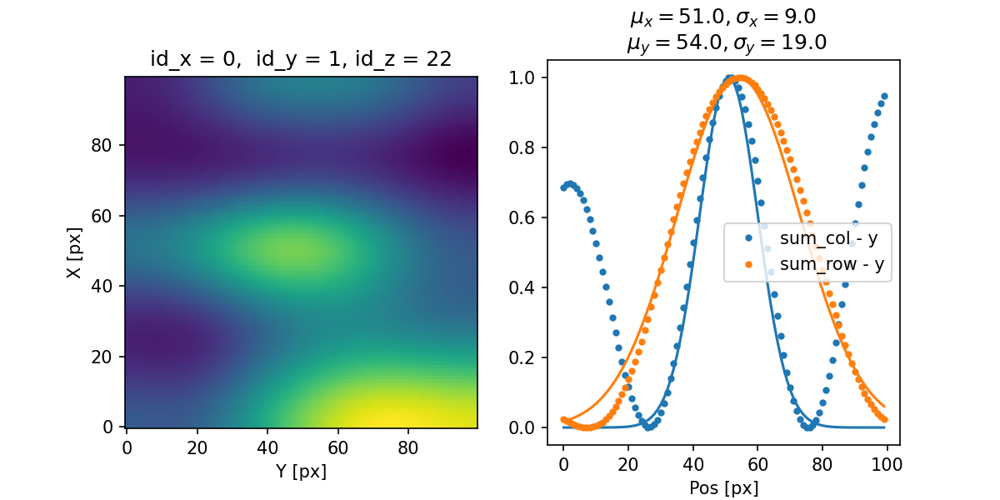

<IPython.core.display.Javascript object>


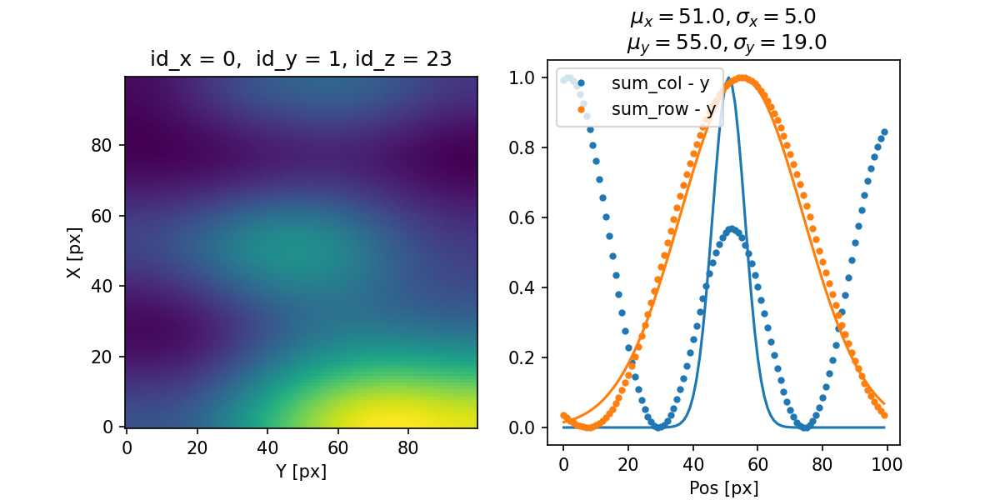

<IPython.core.display.Javascript object>


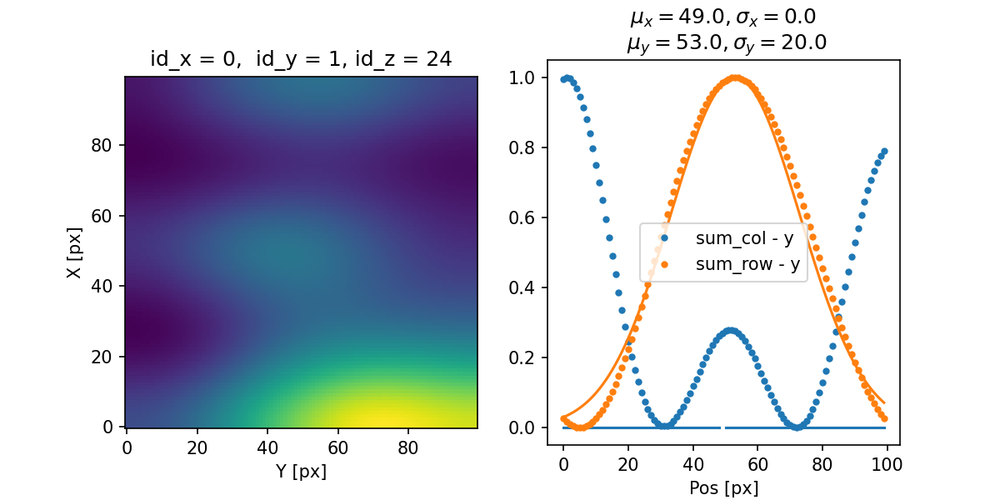

C:\Users\Rui\Documents\GitHub\beam_tomography\beam_tomo.py:110: RuntimeWarning: divide by zero encountered in true_divide
  return 1 * np.exp( - (x - mean)**2 / (2 * standard_deviation ** 2))
C:\Users\Rui\Documents\GitHub\beam_tomography\beam_tomo.py:110: RuntimeWarning: invalid value encountered in true_divide
  return 1 * np.exp( - (x - mean)**2 / (2 * standard_deviation ** 2))


<IPython.core.display.Javascript object>


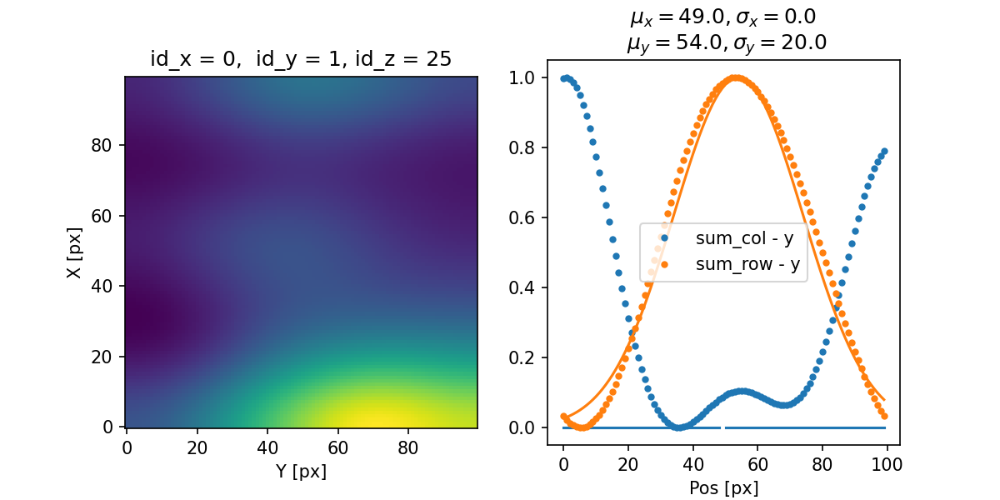

C:\Users\Rui\Documents\GitHub\beam_tomography\beam_tomo.py:110: RuntimeWarning: divide by zero encountered in true_divide
  return 1 * np.exp( - (x - mean)**2 / (2 * standard_deviation ** 2))
C:\Users\Rui\Documents\GitHub\beam_tomography\beam_tomo.py:110: RuntimeWarning: invalid value encountered in true_divide
  return 1 * np.exp( - (x - mean)**2 / (2 * standard_deviation ** 2))


<IPython.core.display.Javascript object>


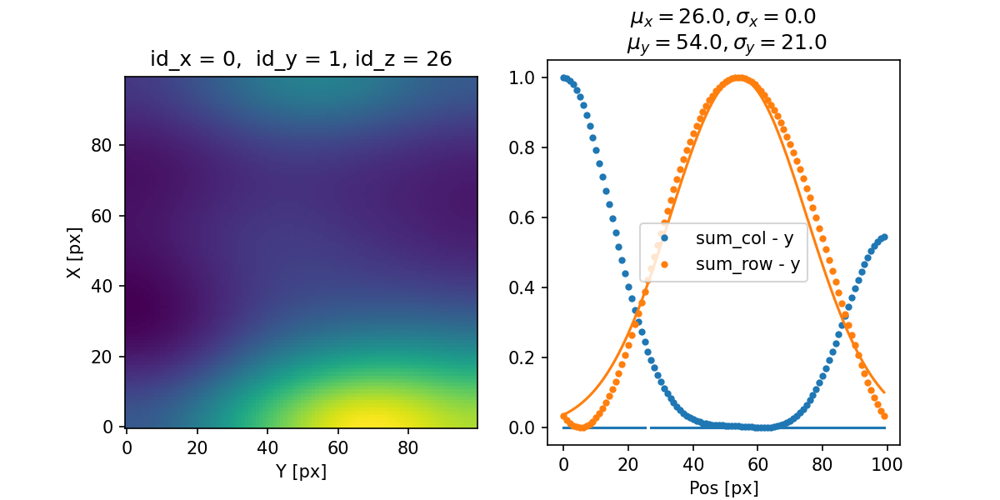

C:\Users\Rui\Documents\GitHub\beam_tomography\beam_tomo.py:110: RuntimeWarning: divide by zero encountered in true_divide
  return 1 * np.exp( - (x - mean)**2 / (2 * standard_deviation ** 2))
C:\Users\Rui\Documents\GitHub\beam_tomography\beam_tomo.py:110: RuntimeWarning: invalid value encountered in true_divide
  return 1 * np.exp( - (x - mean)**2 / (2 * standard_deviation ** 2))


<IPython.core.display.Javascript object>


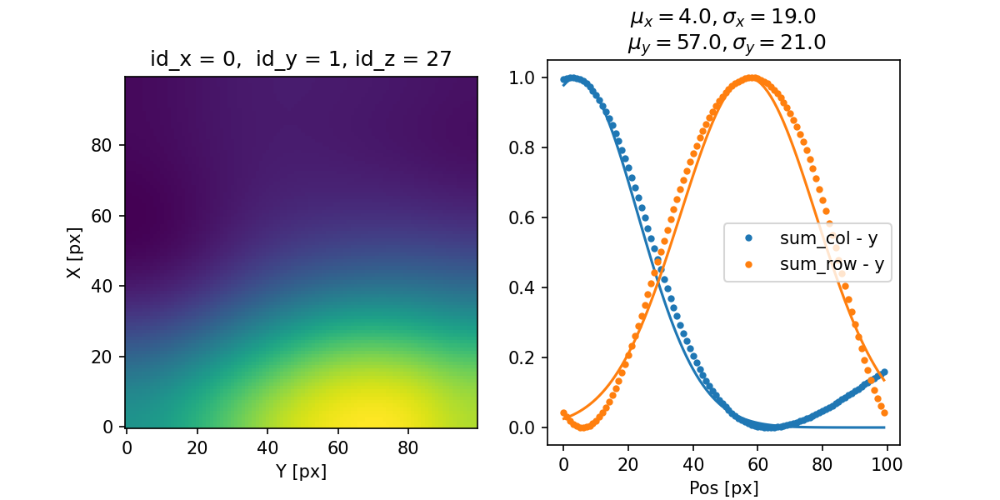

<IPython.core.display.Javascript object>


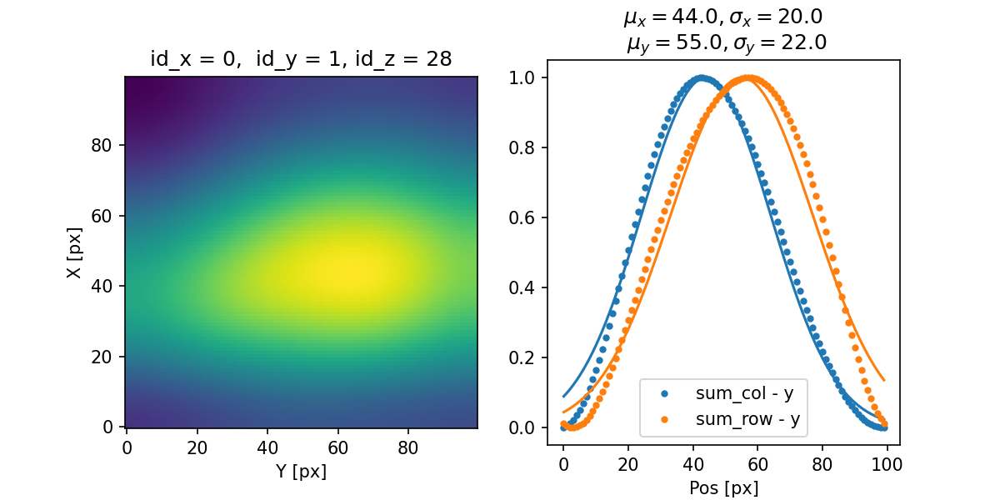

<IPython.core.display.Javascript object>


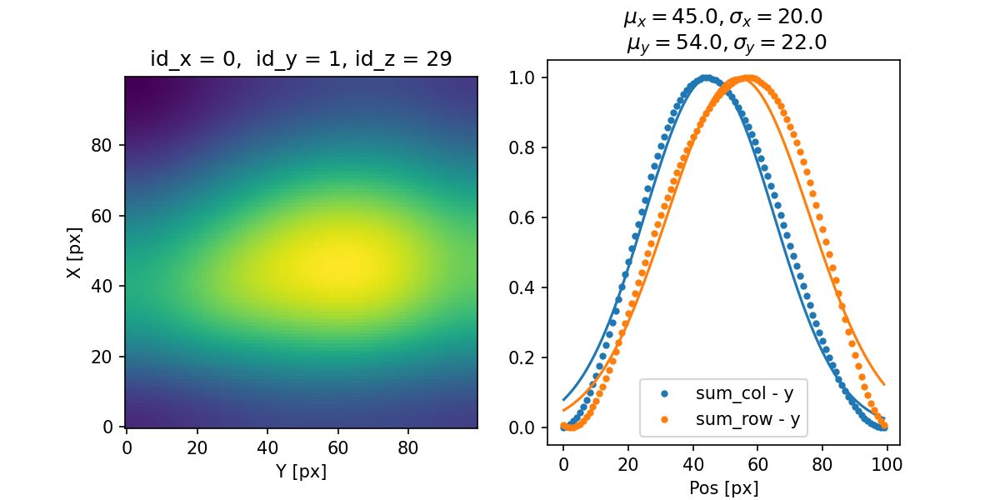

<IPython.core.display.Javascript object>


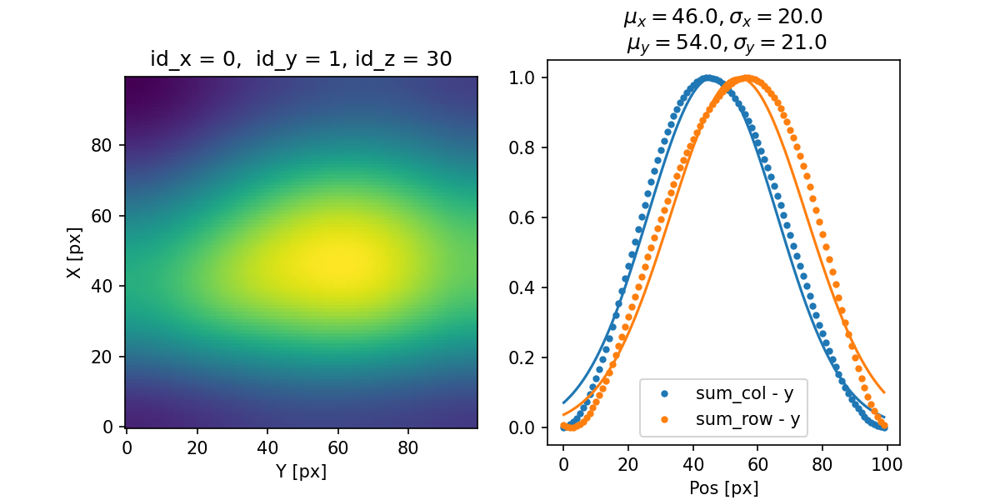

<IPython.core.display.Javascript object>


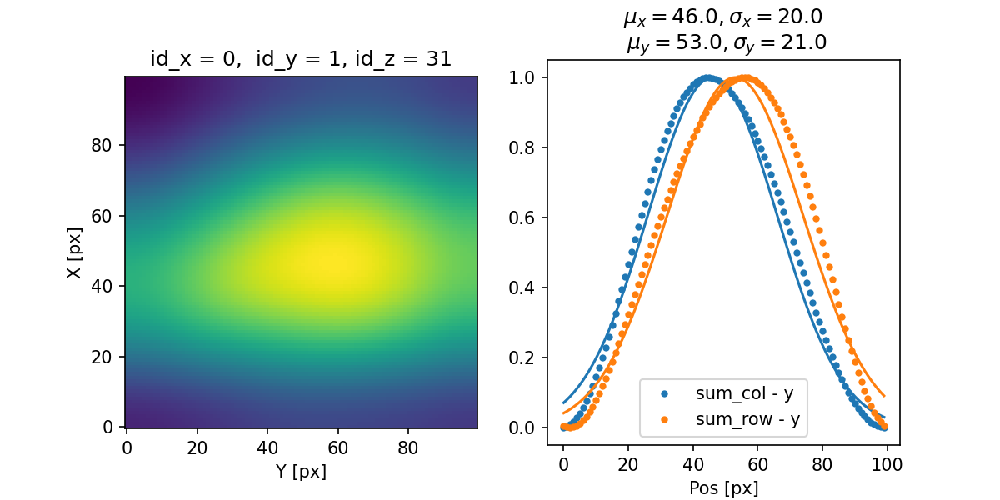

<IPython.core.display.Javascript object>


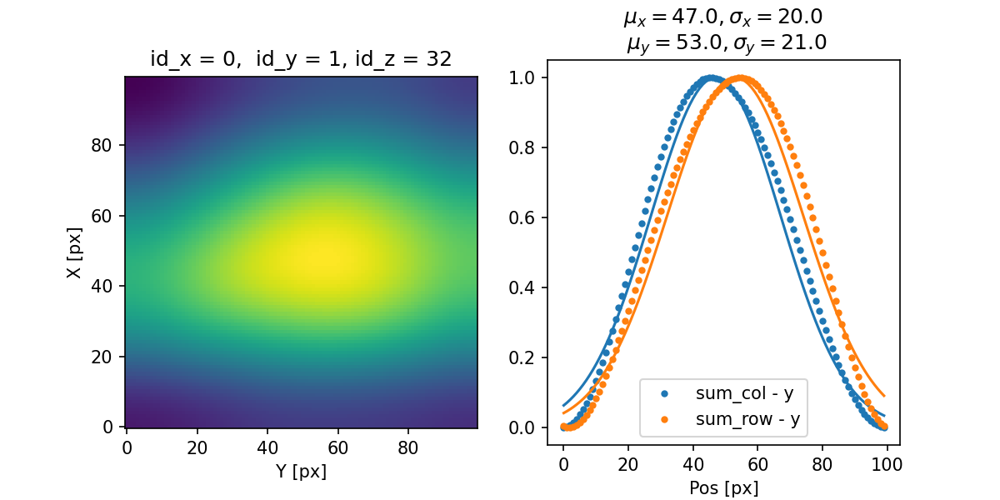

<IPython.core.display.Javascript object>


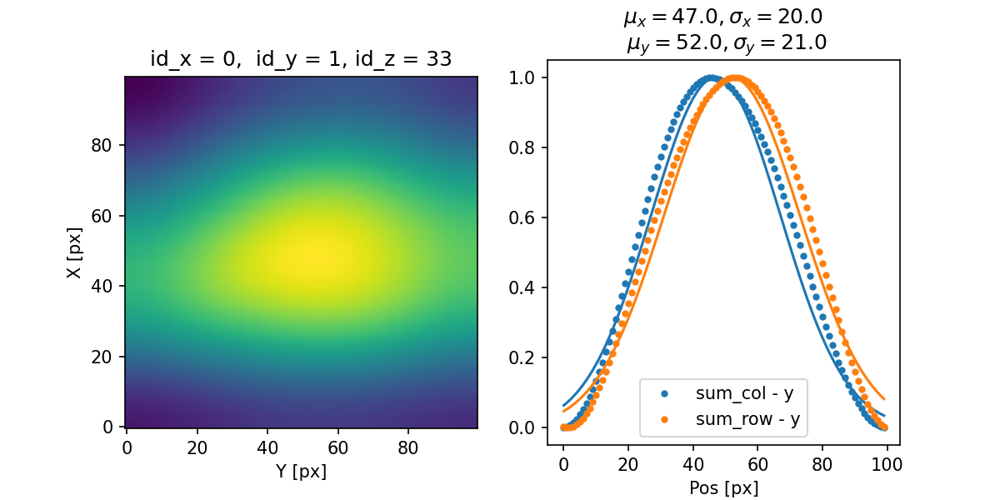

<IPython.core.display.Javascript object>


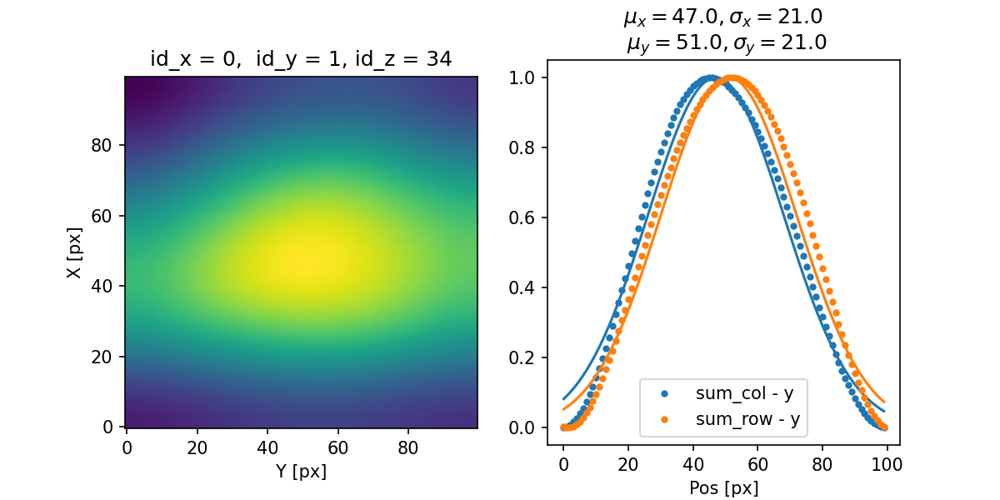

<IPython.core.display.Javascript object>


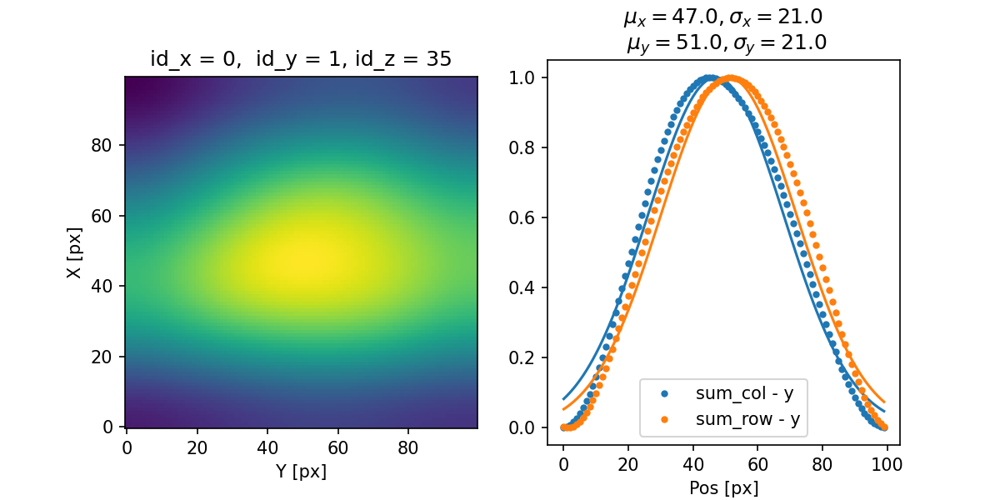

<IPython.core.display.Javascript object>


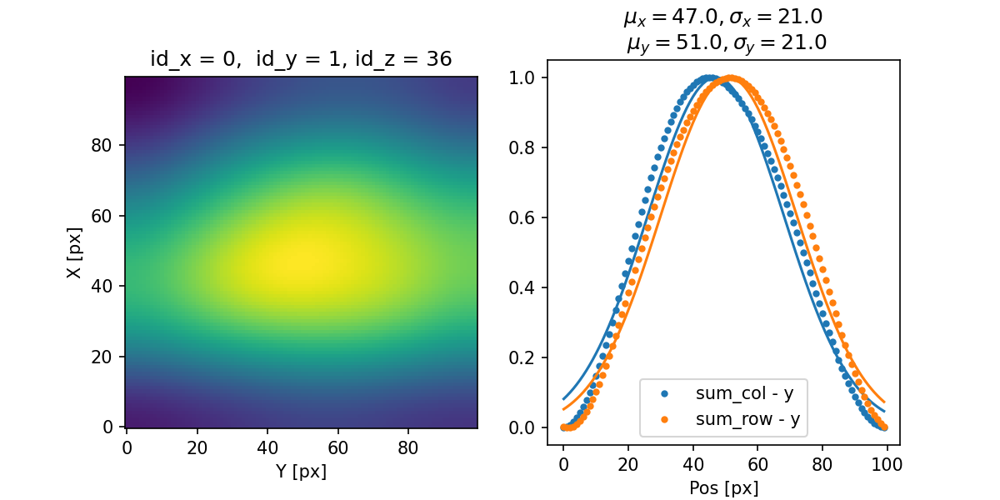

<IPython.core.display.Javascript object>


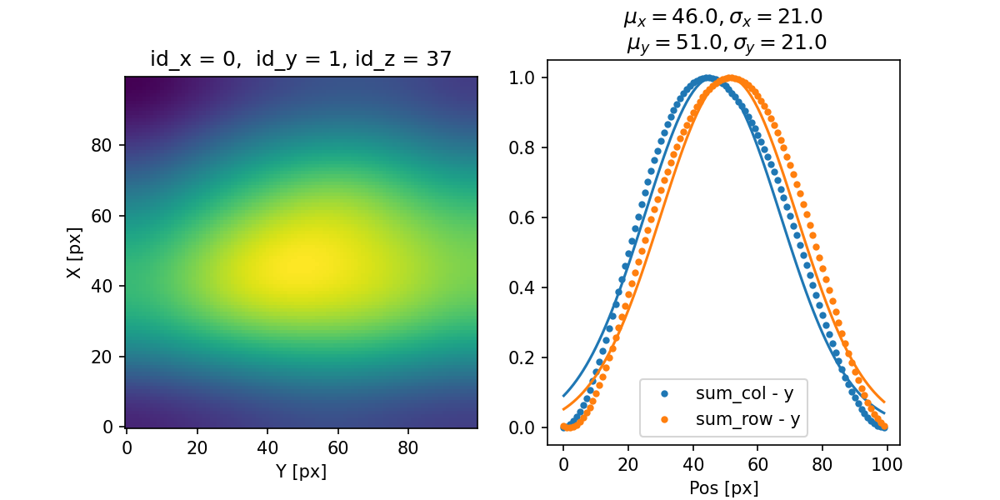

<IPython.core.display.Javascript object>


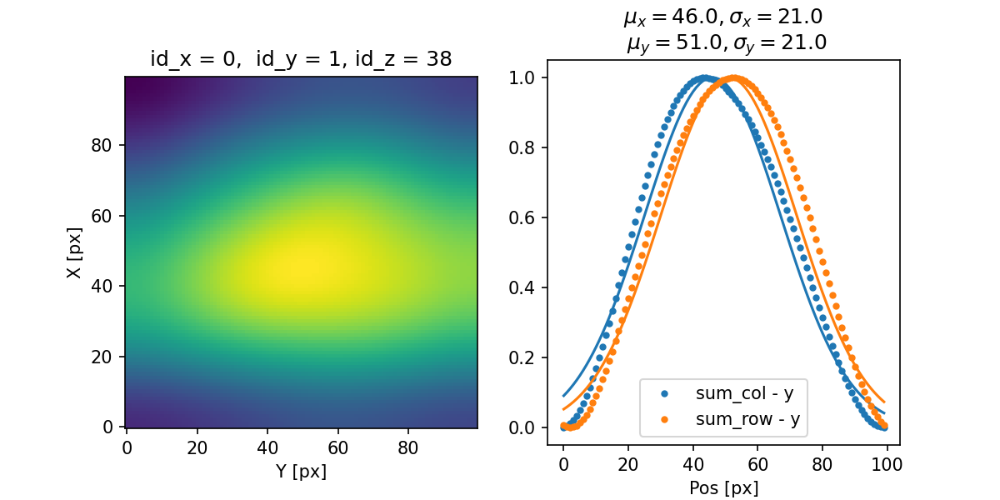

<IPython.core.display.Javascript object>


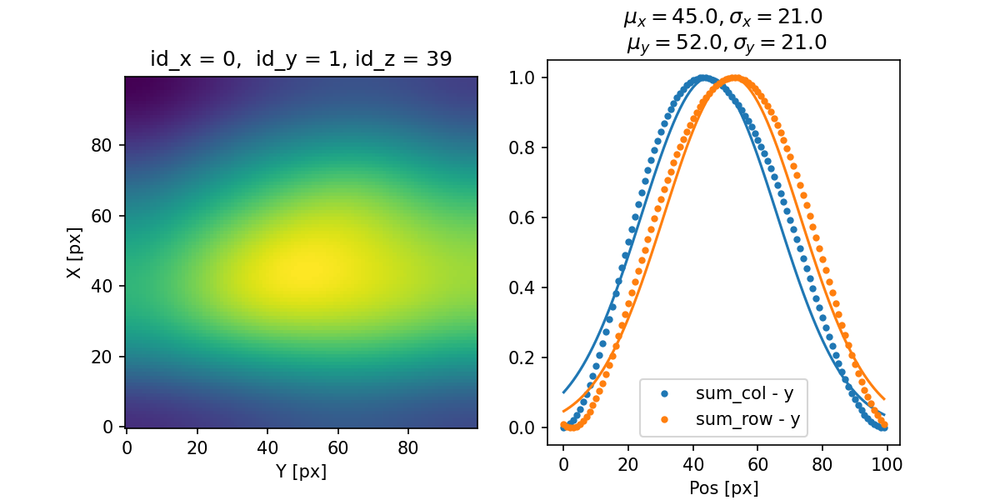

In [7]:
id_x = 0
id_y = 1
beam_i =tomo.beam_l[id_x][id_y]
beam_i.plot_gauss_fit(limit_z_fit = False)

In [ ]:
#beam_i.plot_gauss_fit()
id_x = 0
id_y = 1
beam_i =tomo.beam_l[id_x][id_y]

for id_z in range(len(beam_i.roi_l)):
    roi_i = beam_i.roi_l[id_z]
    col_mu, row_mu, col_sigma, row_sigma = beam_i.roi_fit_params_l[id_z] # fit params
    i_col_arr = beam_i.i_col_l[id_z] #sum over columns
    i_row_arr = beam_i.i_row_l[id_z] #sum over lines
    idx_arr = np.arange(len(i_col_arr))
    
    #Plots
    f, ax = plt.subplots(ncols=2, nrows = 1, figsize = (8,4))
    ax[0].imshow(roi_i, origin = "lower")
    ax[0].set_xlabel("Y [px]")
    ax[0].set_ylabel("X [px]")
    ax[0].set_title(f"id_x = {id_x},  id_y = {id_y}, id_z = {id_z}")

    #plot sum_col - x
    ax[1].plot(idx_arr, i_col_arr, ".",label = "sum_col - y", color = "tab:blue")
    col_fit = gaussian(idx_arr, col_mu, col_sigma)
    ax[1].plot(idx_arr, col_fit, color = "tab:blue")

    #plot sum_col - y
    ax[1].plot(idx_arr, i_row_arr, ".",label = "sum_row - y", color = "tab:orange")
    row_fit = gaussian(idx_arr, row_mu, row_sigma)
    ax[1].plot(idx_arr, row_fit, color = "tab:orange")

    ax[1].set_title(f"$\mu_x = {{{col_mu:.1f}}},  \sigma_x = {{{col_sigma:.1f}}}$ \n $\mu_y = {{{row_mu:.1f}}},  \sigma_y = {{{row_sigma:.1f}}}$")
    ax[1].set_xlabel("Pos [px]")
    ax[1].legend()

    if id_z == 20: break

# Plot cross sections

In [ ]:
#for i in range(tomo.n_sections):
for i in range(10):
    tomo.plot_cross_section(i)

In [ ]:
tomo.plot_cross_section(35)
tomo.plot_cross_section(0)


# Extract beam parameters (tilt_x, tilt_y, div_x, div_y) 

## Find direction cosines

Tomo.max_z_fit and Tomo.max_z_idx_fit have been updated.
beam_i.max_z_fit and beam_i.max_z_idx_fit have been updated in all beams.
The direction cosines of the beam idx=0, idy = 0 have been updated:
e_x = -0.066, e_y = 0.153, e_z = 0.986


<IPython.core.display.Javascript object>


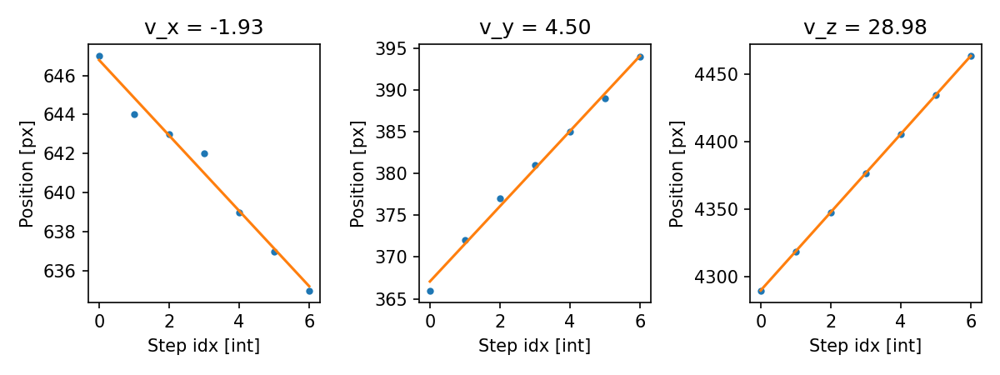

e_x = -0.07 --> alpha = 93.76deg
e_y = 0.15 --> beta = 81.19deg
e_z = 0.99 --> gamma = 9.59deg
The direction cosines of the beam idx=0, idy = 1 have been updated:
e_x = -0.076, e_y = 0.127, e_z = 0.989


<IPython.core.display.Javascript object>


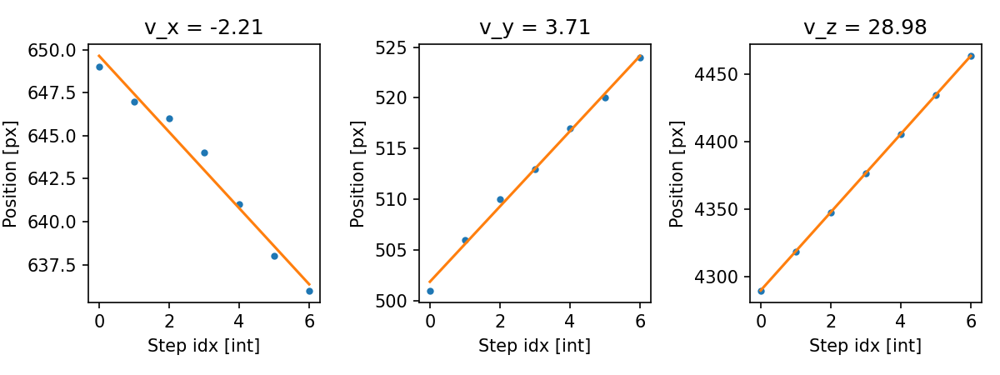

e_x = -0.08 --> alpha = 94.33deg
e_y = 0.13 --> beta = 82.72deg
e_z = 0.99 --> gamma = 8.49deg
The direction cosines of the beam idx=0, idy = 2 have been updated:
e_x = -0.073, e_y = 0.103, e_z = 0.992


<IPython.core.display.Javascript object>


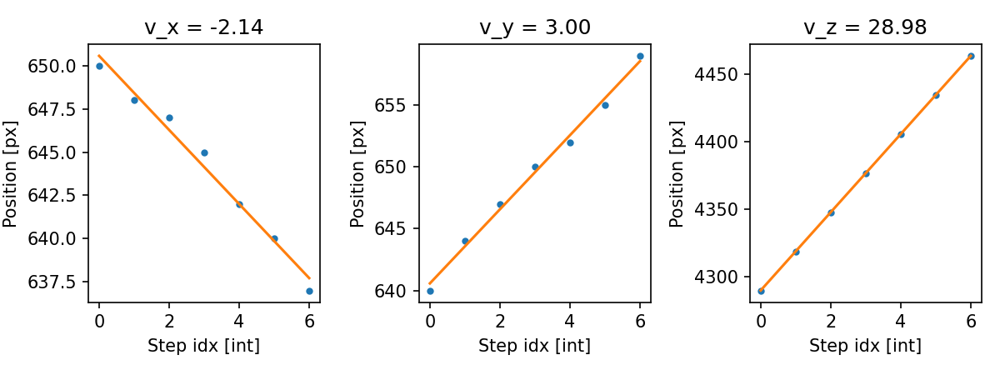

e_x = -0.07 --> alpha = 94.21deg
e_y = 0.10 --> beta = 84.11deg
e_z = 0.99 --> gamma = 7.25deg
The direction cosines of the beam idx=0, idy = 3 have been updated:
e_x = -0.066, e_y = 0.052, e_z = 0.996


<IPython.core.display.Javascript object>


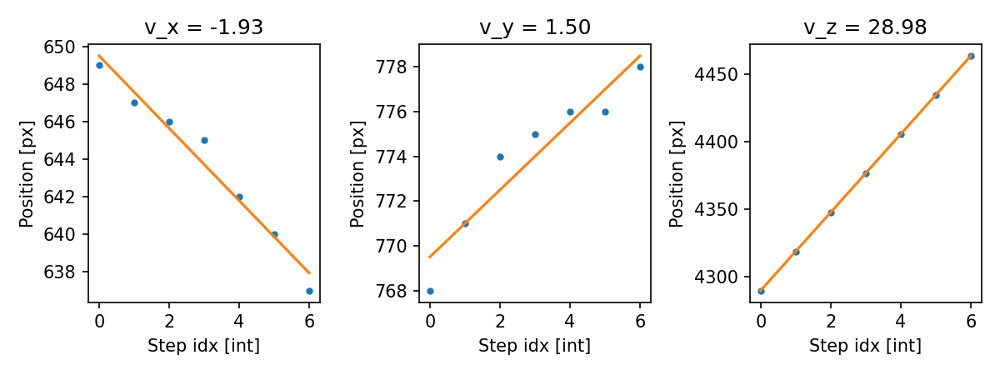

e_x = -0.07 --> alpha = 93.80deg
e_y = 0.05 --> beta = 87.04deg
e_z = 1.00 --> gamma = 4.82deg
The direction cosines of the beam idx=0, idy = 4 have been updated:
e_x = -0.066, e_y = 0.050, e_z = 0.997


<IPython.core.display.Javascript object>


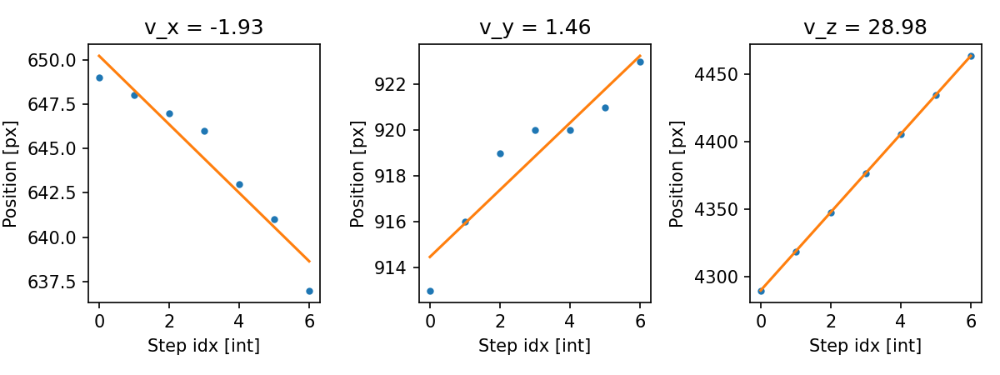

e_x = -0.07 --> alpha = 93.80deg
e_y = 0.05 --> beta = 87.11deg
e_z = 1.00 --> gamma = 4.78deg
The direction cosines of the beam idx=0, idy = 5 have been updated:
e_x = -0.069, e_y = 0.025, e_z = 0.997


<IPython.core.display.Javascript object>


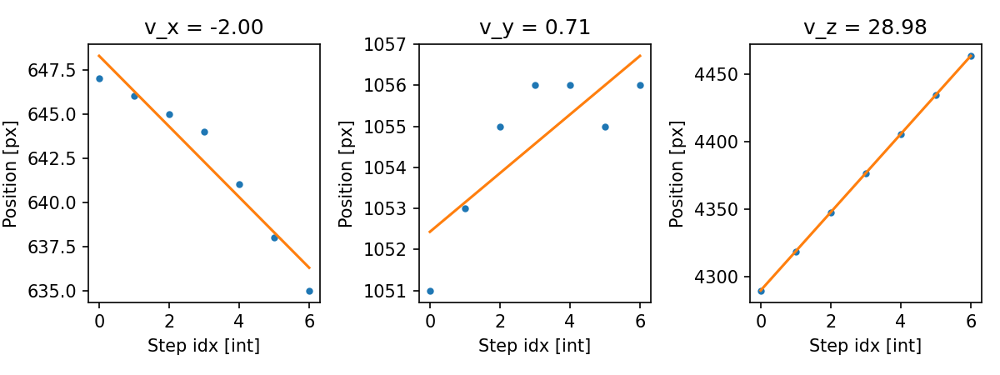

e_x = -0.07 --> alpha = 93.95deg
e_y = 0.02 --> beta = 88.59deg
e_z = 1.00 --> gamma = 4.19deg
The direction cosines of the beam idx=0, idy = 6 have been updated:
e_x = -0.070, e_y = 0.025, e_z = 0.997


<IPython.core.display.Javascript object>


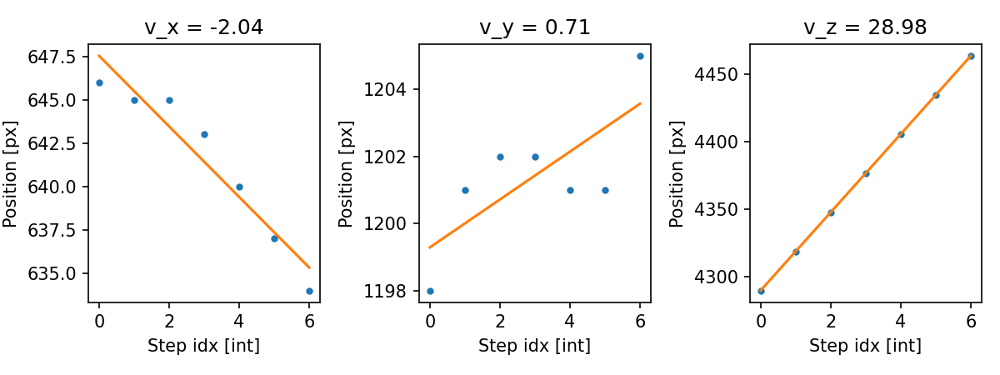

e_x = -0.07 --> alpha = 94.02deg
e_y = 0.02 --> beta = 88.59deg
e_z = 1.00 --> gamma = 4.26deg
The direction cosines of the beam idx=0, idy = 7 have been updated:
e_x = -0.083, e_y = 0.014, e_z = 0.996


<IPython.core.display.Javascript object>


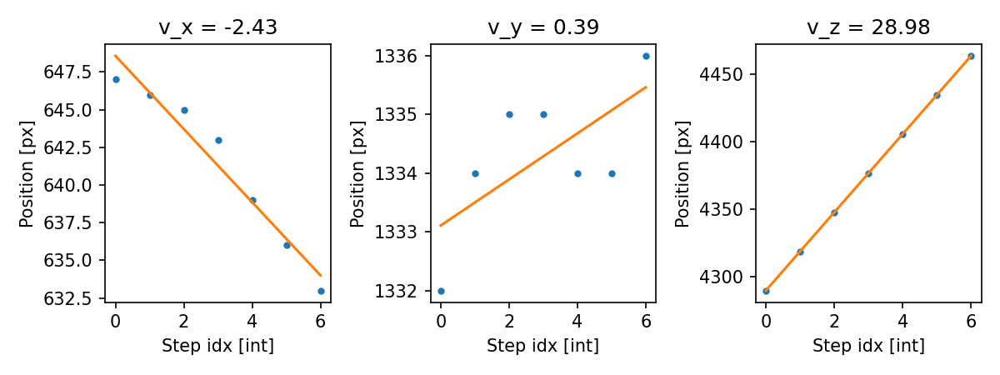

e_x = -0.08 --> alpha = 94.79deg
e_y = 0.01 --> beta = 89.23deg
e_z = 1.00 --> gamma = 4.85deg
The direction cosines of the beam idx=0, idy = 8 have been updated:
e_x = -0.087, e_y = 0.007, e_z = 0.996


C:\Users\Rui\Documents\GitHub\beam_tomography\beam_tomo.py:592: RuntimeWarning: More than 50 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f, ax = plt.subplots(nrows=1, ncols=3, figsize=(8, 3))


<IPython.core.display.Javascript object>


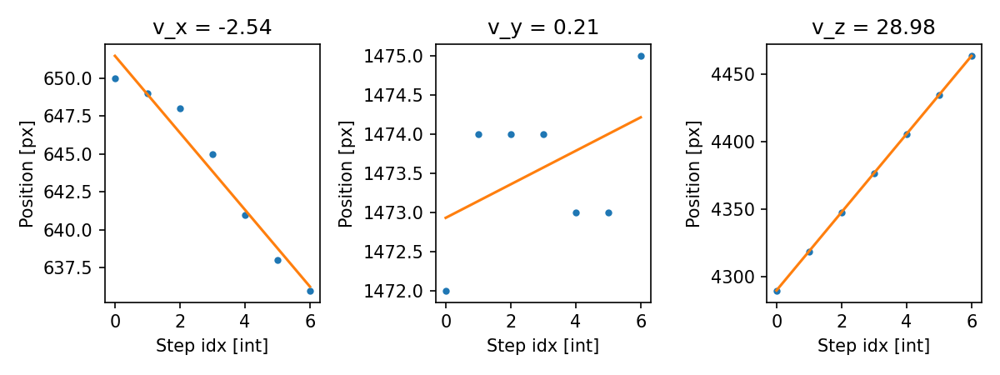

e_x = -0.09 --> alpha = 95.00deg
e_y = 0.01 --> beta = 89.58deg
e_z = 1.00 --> gamma = 5.02deg
The direction cosines of the beam idx=0, idy = 9 have been updated:
e_x = -0.069, e_y = -0.017, e_z = 0.997


<IPython.core.display.Javascript object>


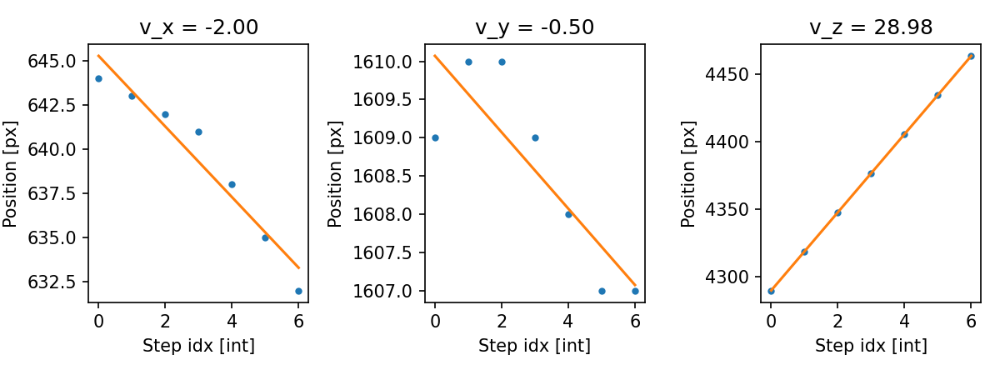

e_x = -0.07 --> alpha = 93.95deg
e_y = -0.02 --> beta = 90.99deg
e_z = 1.00 --> gamma = 4.07deg
The direction cosines of the beam idx=1, idy = 0 have been updated:
e_x = -0.063, e_y = 0.126, e_z = 0.990


<IPython.core.display.Javascript object>


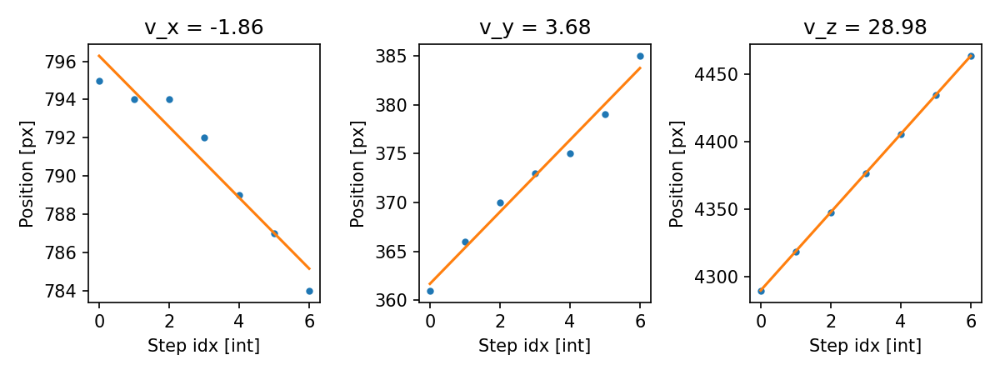

e_x = -0.06 --> alpha = 93.64deg
e_y = 0.13 --> beta = 82.78deg
e_z = 0.99 --> gamma = 8.09deg
The direction cosines of the beam idx=1, idy = 1 have been updated:
e_x = -0.056, e_y = 0.179, e_z = 0.982


<IPython.core.display.Javascript object>


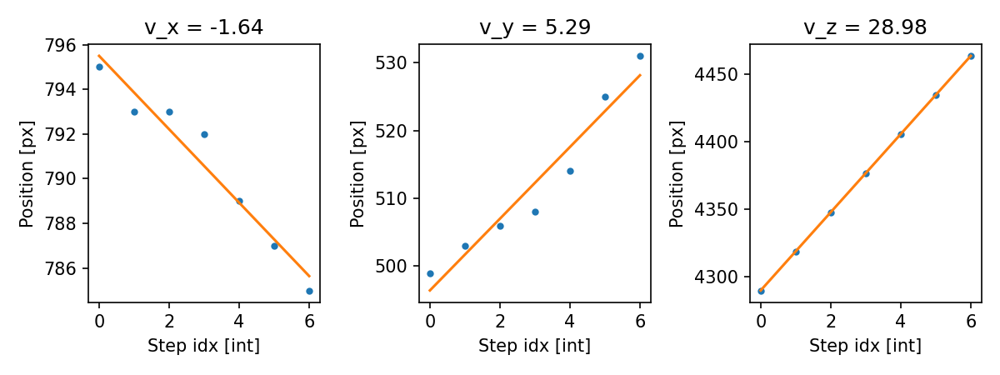

e_x = -0.06 --> alpha = 93.19deg
e_y = 0.18 --> beta = 79.68deg
e_z = 0.98 --> gamma = 10.81deg
The direction cosines of the beam idx=1, idy = 2 have been updated:
e_x = -0.053, e_y = 0.099, e_z = 0.994


<IPython.core.display.Javascript object>


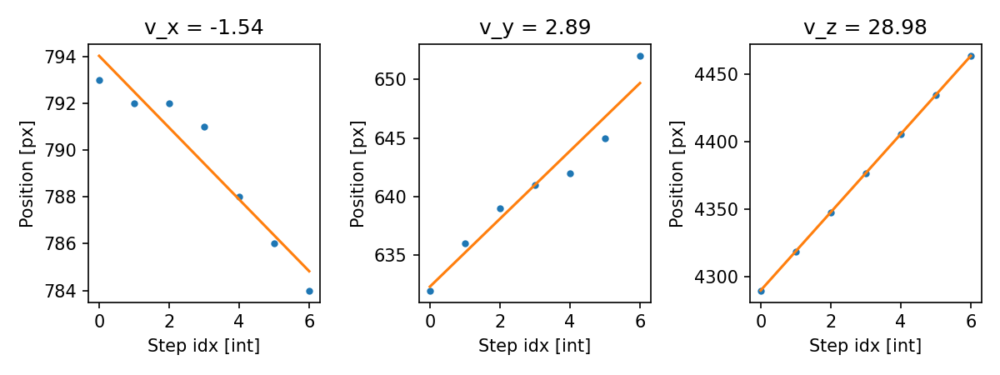

e_x = -0.05 --> alpha = 93.02deg
e_y = 0.10 --> beta = 84.31deg
e_z = 0.99 --> gamma = 6.45deg
The direction cosines of the beam idx=1, idy = 3 have been updated:
e_x = -0.059, e_y = 0.071, e_z = 0.996


<IPython.core.display.Javascript object>


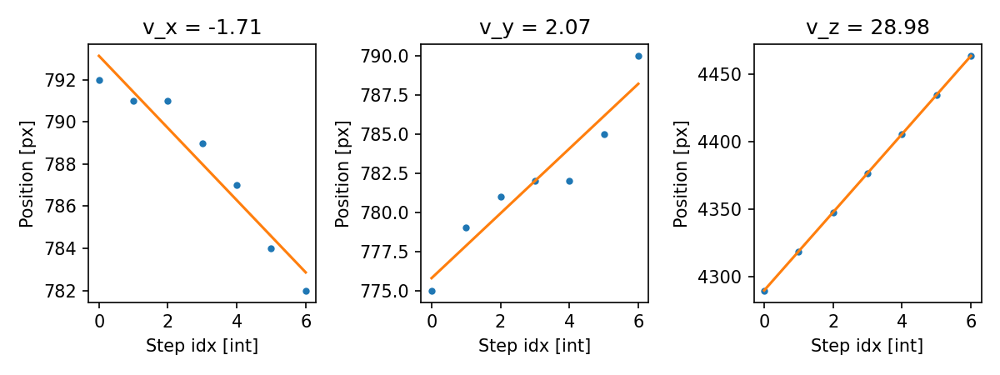

e_x = -0.06 --> alpha = 93.38deg
e_y = 0.07 --> beta = 85.92deg
e_z = 1.00 --> gamma = 5.30deg
The direction cosines of the beam idx=1, idy = 4 have been updated:
e_x = -0.057, e_y = 0.044, e_z = 0.997


<IPython.core.display.Javascript object>


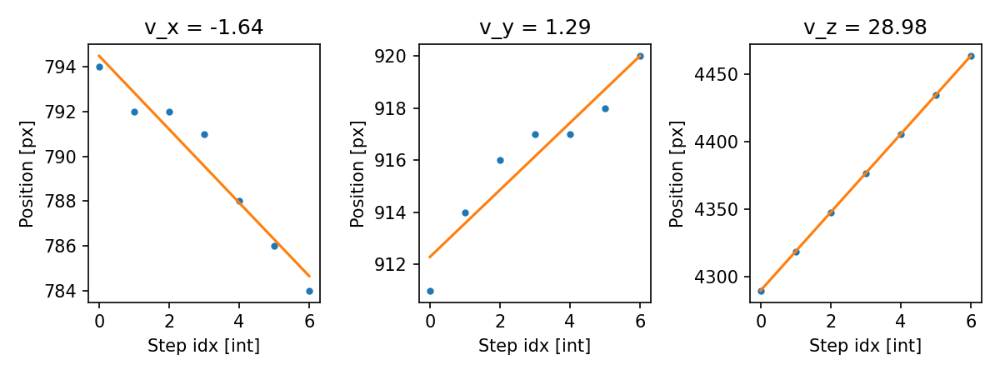

e_x = -0.06 --> alpha = 93.24deg
e_y = 0.04 --> beta = 87.46deg
e_z = 1.00 --> gamma = 4.12deg
The direction cosines of the beam idx=1, idy = 5 have been updated:
e_x = -0.059, e_y = 0.021, e_z = 0.998


<IPython.core.display.Javascript object>


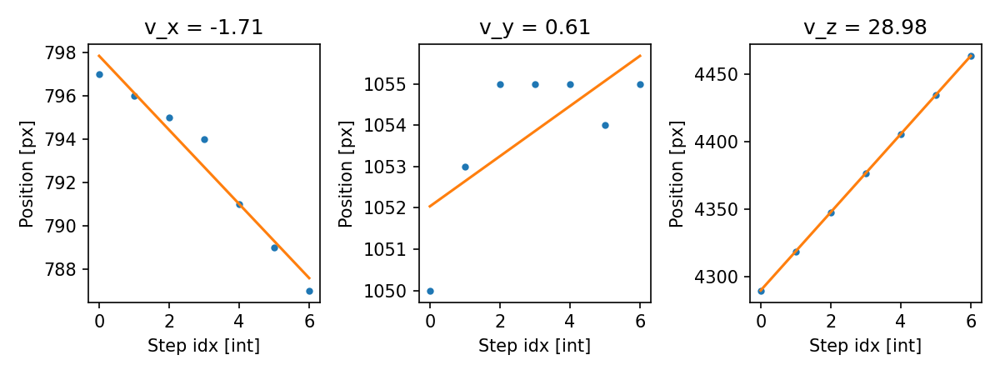

e_x = -0.06 --> alpha = 93.38deg
e_y = 0.02 --> beta = 88.80deg
e_z = 1.00 --> gamma = 3.59deg
The direction cosines of the beam idx=1, idy = 6 have been updated:
e_x = -0.063, e_y = 0.014, e_z = 0.998


<IPython.core.display.Javascript object>


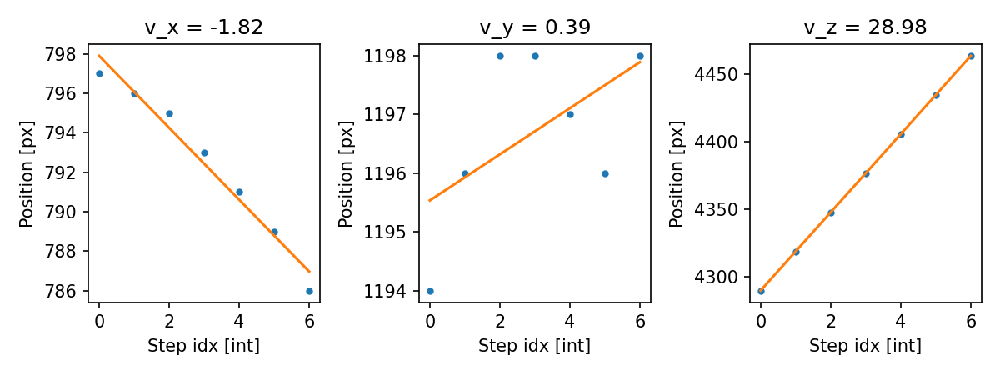

e_x = -0.06 --> alpha = 93.60deg
e_y = 0.01 --> beta = 89.22deg
e_z = 1.00 --> gamma = 3.68deg
The direction cosines of the beam idx=1, idy = 7 have been updated:
e_x = -0.052, e_y = 0.004, e_z = 0.999


<IPython.core.display.Javascript object>


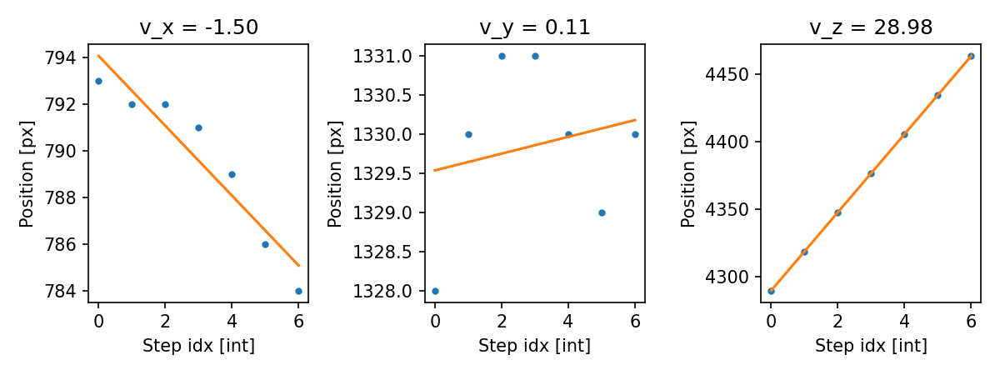

e_x = -0.05 --> alpha = 92.96deg
e_y = 0.00 --> beta = 89.79deg
e_z = 1.00 --> gamma = 2.97deg
The direction cosines of the beam idx=1, idy = 8 have been updated:
e_x = -0.059, e_y = -0.017, e_z = 0.998


<IPython.core.display.Javascript object>


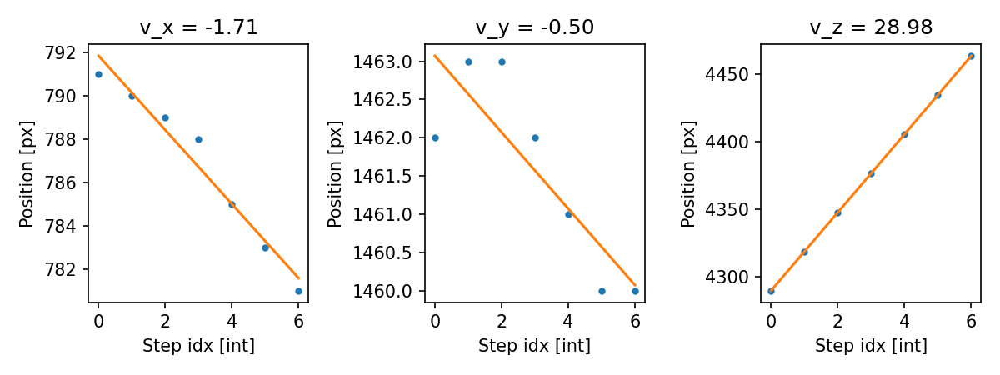

e_x = -0.06 --> alpha = 93.38deg
e_y = -0.02 --> beta = 90.99deg
e_z = 1.00 --> gamma = 3.53deg
The direction cosines of the beam idx=1, idy = 9 have been updated:
e_x = -0.055, e_y = -0.028, e_z = 0.998


<IPython.core.display.Javascript object>


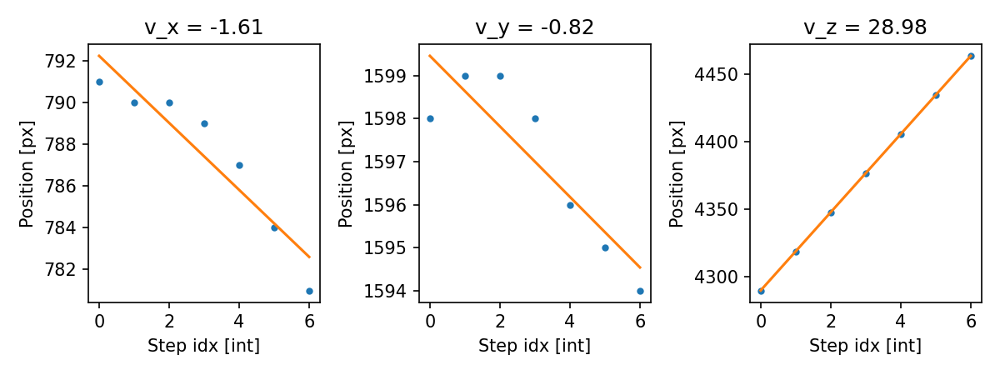

e_x = -0.06 --> alpha = 93.17deg
e_y = -0.03 --> beta = 91.62deg
e_z = 1.00 --> gamma = 3.56deg
The direction cosines of the beam idx=2, idy = 0 have been updated:
e_x = -0.060, e_y = 0.123, e_z = 0.991


<IPython.core.display.Javascript object>


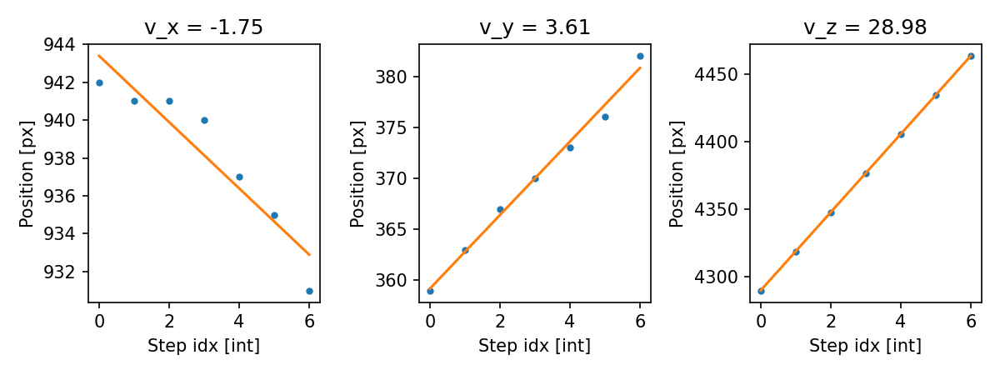

e_x = -0.06 --> alpha = 93.43deg
e_y = 0.12 --> beta = 82.92deg
e_z = 0.99 --> gamma = 7.88deg
The direction cosines of the beam idx=2, idy = 1 have been updated:
e_x = -0.049, e_y = 0.045, e_z = 0.998


<IPython.core.display.Javascript object>


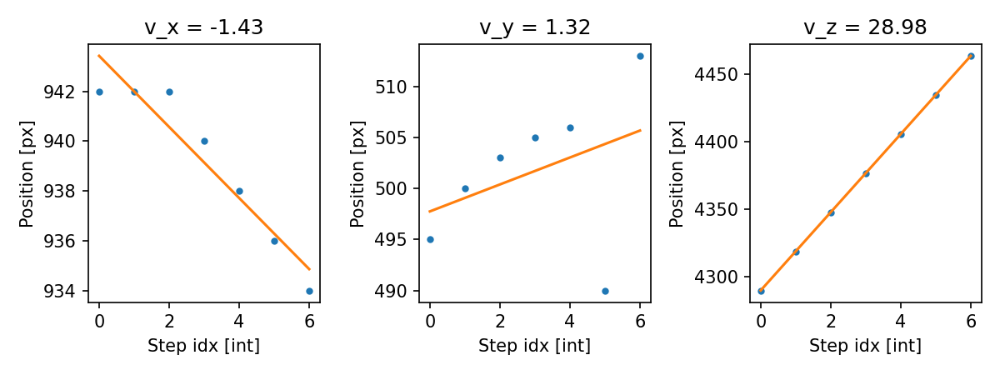

e_x = -0.05 --> alpha = 92.82deg
e_y = 0.05 --> beta = 87.39deg
e_z = 1.00 --> gamma = 3.84deg
The direction cosines of the beam idx=2, idy = 2 have been updated:
e_x = -0.049, e_y = -0.016, e_z = 0.999


<IPython.core.display.Javascript object>


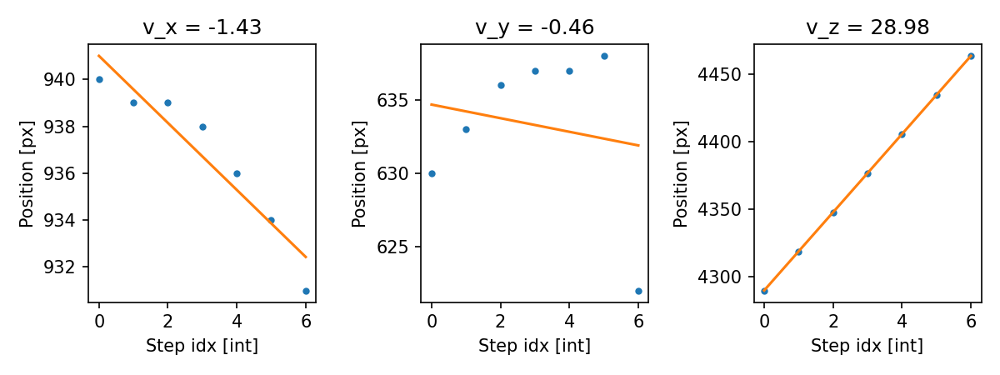

e_x = -0.05 --> alpha = 92.82deg
e_y = -0.02 --> beta = 90.92deg
e_z = 1.00 --> gamma = 2.97deg
The direction cosines of the beam idx=2, idy = 3 have been updated:
e_x = -0.028, e_y = 0.031, e_z = 0.999


<IPython.core.display.Javascript object>


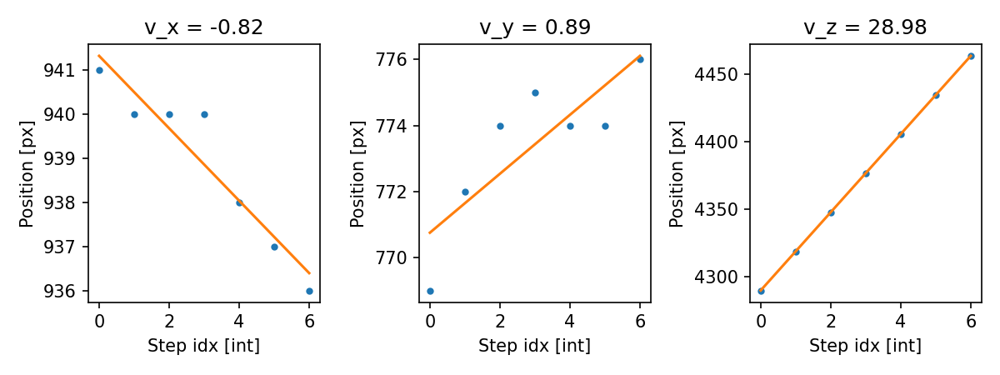

e_x = -0.03 --> alpha = 91.62deg
e_y = 0.03 --> beta = 88.24deg
e_z = 1.00 --> gamma = 2.40deg
The direction cosines of the beam idx=2, idy = 4 have been updated:
e_x = -0.055, e_y = 0.034, e_z = 0.998


<IPython.core.display.Javascript object>


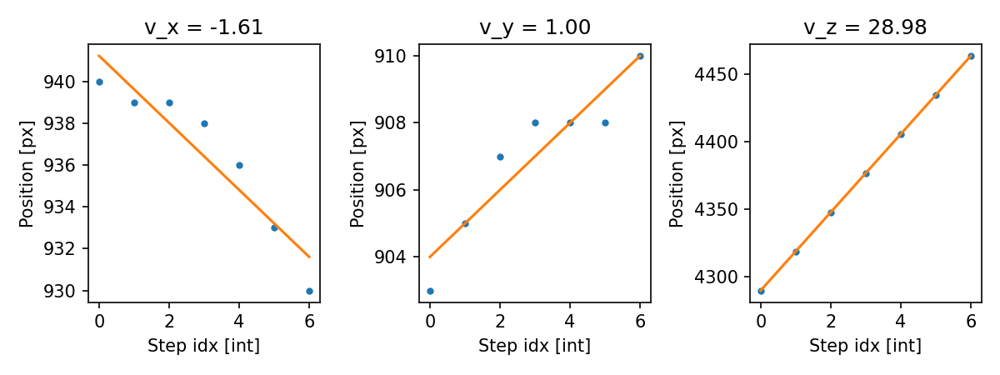

e_x = -0.06 --> alpha = 93.17deg
e_y = 0.03 --> beta = 88.03deg
e_z = 1.00 --> gamma = 3.74deg
The direction cosines of the beam idx=2, idy = 5 have been updated:
e_x = -0.047, e_y = 0.023, e_z = 0.999


<IPython.core.display.Javascript object>


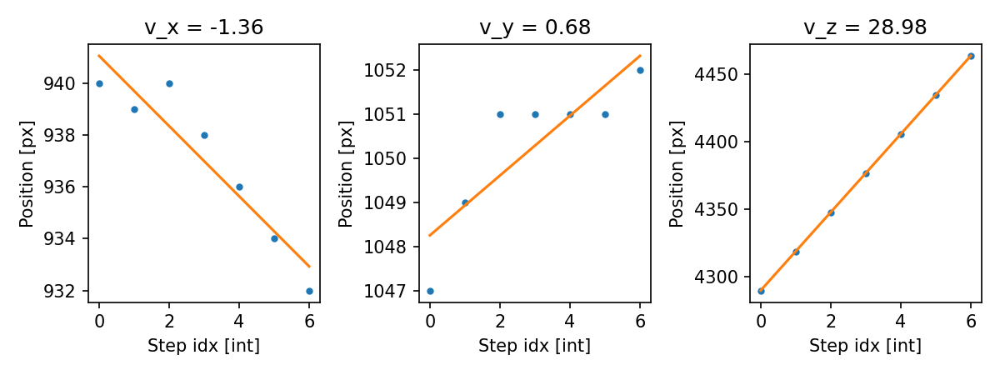

e_x = -0.05 --> alpha = 92.68deg
e_y = 0.02 --> beta = 88.66deg
e_z = 1.00 --> gamma = 3.00deg
The direction cosines of the beam idx=2, idy = 6 have been updated:
e_x = -0.055, e_y = 0.011, e_z = 0.998


<IPython.core.display.Javascript object>


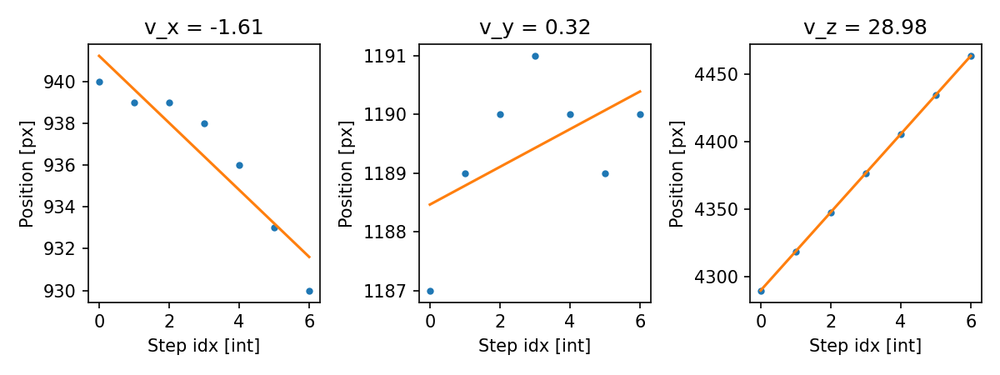

e_x = -0.06 --> alpha = 93.17deg
e_y = 0.01 --> beta = 89.37deg
e_z = 1.00 --> gamma = 3.24deg
The direction cosines of the beam idx=2, idy = 7 have been updated:
e_x = -0.043, e_y = -0.000, e_z = 0.999


<IPython.core.display.Javascript object>


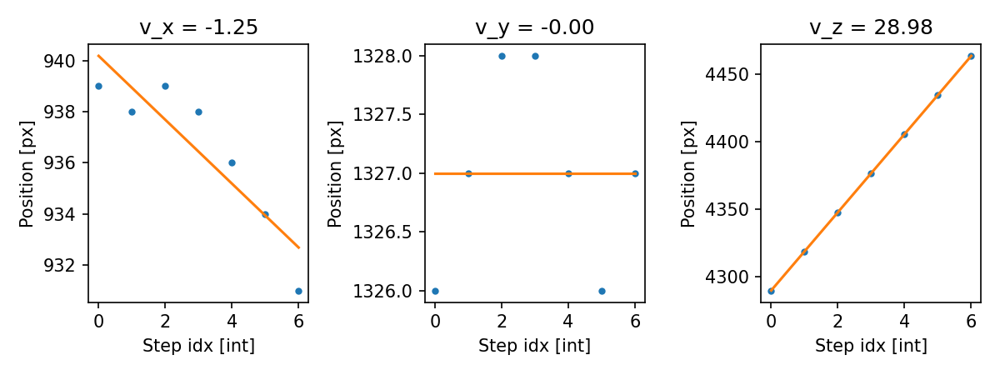

e_x = -0.04 --> alpha = 92.47deg
e_y = -0.00 --> beta = 90.00deg
e_z = 1.00 --> gamma = 2.47deg
The direction cosines of the beam idx=2, idy = 8 have been updated:
e_x = -0.052, e_y = -0.041, e_z = 0.998


<IPython.core.display.Javascript object>


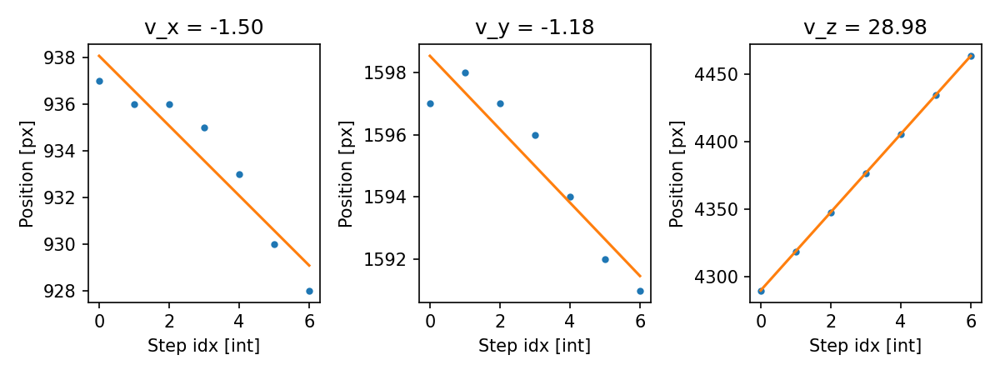

e_x = -0.05 --> alpha = 92.96deg
e_y = -0.04 --> beta = 92.33deg
e_z = 1.00 --> gamma = 3.77deg
The direction cosines of the beam idx=2, idy = 9 have been updated:
e_x = -0.052, e_y = -0.041, e_z = 0.998


<IPython.core.display.Javascript object>


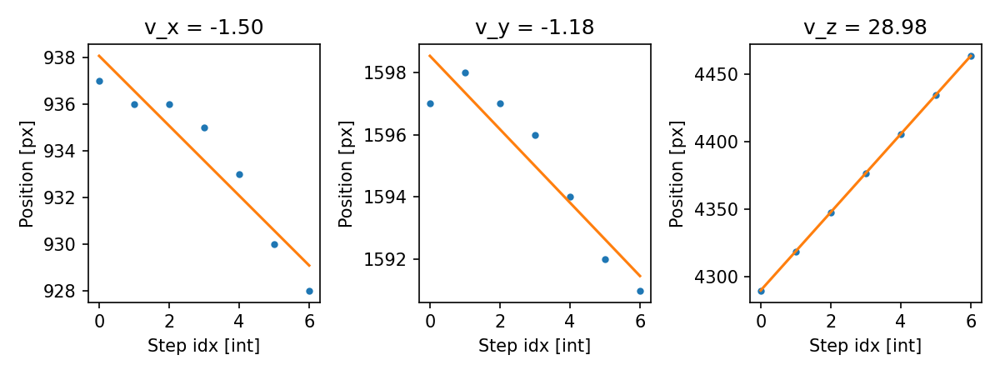

e_x = -0.05 --> alpha = 92.96deg
e_y = -0.04 --> beta = 92.33deg
e_z = 1.00 --> gamma = 3.77deg


In [10]:
tomo.set_max_z(15.5)
tomo.find_dir_cos(debug = True) #loops over beam method beam_i.find_dir_cos()

In [11]:
tomo.find_div(debug = True) #loops over beam method beam_i.find_div

AttributeError: 'Tomography' object has no attribute 'find_div'

## Find divergence angle

In [ ]:
#for id_x in range(tomo.shape[0]):
#    for id_y in range(tomo.shape[1]):

id_x = 0
id_y = 0
beam_i = tomo.beam_l[id_x][id_y]

#set max_z_id
max_z_idx = 8

#extract beam_width arrays and z_arr
beam_width = np.array(beam_i.beam_width_l)
beam_width_x = beam_width[:max_z_idx, 0]
beam_width_y = beam_width[:max_z_idx, 1]
z_arr = np.array(beam_i.beam_coord_l)[:max_z_idx, 2]
z_px_arr = (z_arr*10**-3)/(tomo.pixel_size)

#plot beam_width_x vs z_arr and beam_width_y vs z_arr
f, ax = plt.subplots(figsize = (4, 4))
ax.plot(z_px_arr, beam_width_x , ".", label = "x sigma")
ax.plot(z_px_arr, beam_width_y, ".",label = "y sigma")
ax.set_ylabel("Width [px]")
ax.set_xlabel("Z pos [px]")
ax.legend()


#fit linear curve to width vs z to extract div_angle
#z_arr = beam_i.beam_coord_l[]



In [ ]:
print(e_x, e_y, e_z)

In [ ]:
np.linalg.norm([e_x, e_y, e_z])

In [ ]:
pos(0, 12, 1)

In [ ]:
id_x = 0
id_y = 0
for id_x in range(tomo.shape[0]):
    for id_y in range(tomo.shape[1]):
        beam_i =tomo.beam_l[id_x][id_y]
        beam_i.plot_trajectory(limit_z_fit = True)

# 8. Visualise cross sections with location of beams and ROIs

# 9. Visualise single beam (3D)

## Visualise first layer with ROI

In [ ]:
time_start = time.time()

#call tomo.coord_init()
exp_num_peaks = tomo.shape[0]*tomo.shape[1]
cross_i = tomo.cross_sect_l[0]
spacing = int(cross_i.spacing_px)
image_i = tomo.cross_sect_l[0].image_rot

peak_arr = feature.peak_local_max(image_i, num_peaks = exp_num_peaks, min_distance = int(spacing*0.9))

#pass info to cross section
#tomo.cross_sect_l[0].beam_coord_l = peak_arr

#pass info to each beam in tomo.beam_l
#for beam_i in tomo.beam_l:
#    beam_i.beam_coord_l = peak_arr

#time_stop = time.time()
#print("The task took", time_stop-time_start, "s to complete.")

## Beam and cross section classes

## Collect cross sections of the same beam for different z